<p style="background-color:blue; font-family:calibri; color:white; font-size:250%; text-align:center; border-radius:15px 50px;">
    Capstone Project | Digital Marketing Campaign Conversion Predicition
</p>

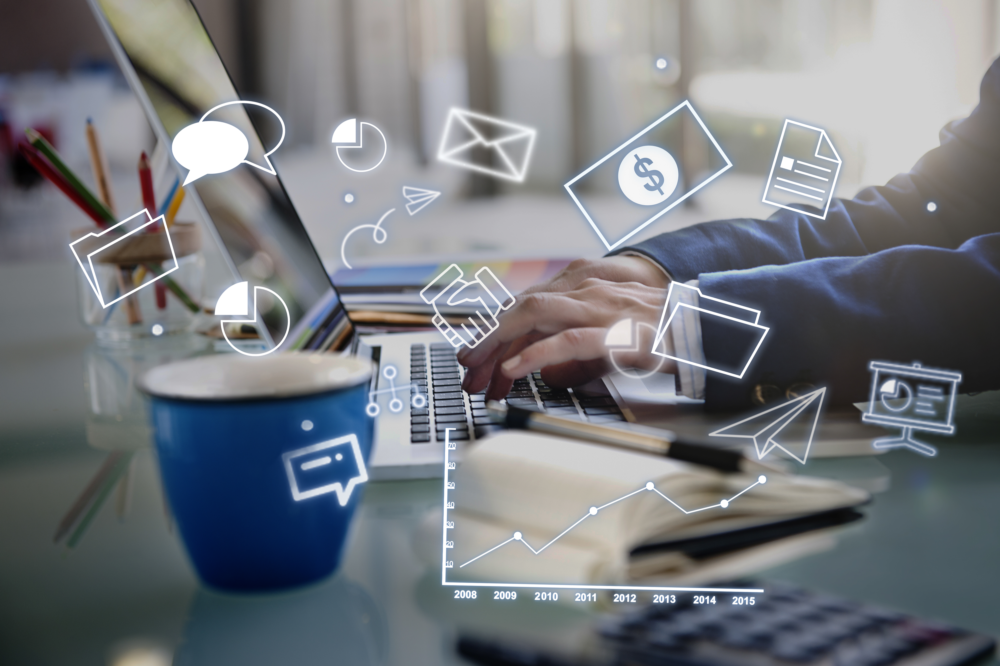

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:125%; text-align:left">

<h3 align="left" style="font-size:160%;"><font color=red>Problem:</font></h3>

Develop a robust machine learning model to accurately predict customer conversions based on various demographic and engagement factors. By utilizing this model, the company aims to improve campaign targeting.

</div>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:125%; text-align:left">

<h3 align="left" style="font-size:160%;"><font color=red>Objective:</font></h3>

In this project, we delve into a dataset capturing various demographic and engagement attributes of customers, such as age, income, online activity, and interaction history. Our goal is to develop a predictive model capable of accurately identifying individuals most likely to convert. Given the significant impact of targeting the right audience, the model aims to assist in improving campaign effectiveness.

</div>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left;  color:black;">

<h3 align="left" style="font-size:180%; color:red;">Workflow:</h3>

* <b style="color:#0077b6;">Explore the Dataset</b>: Uncover patterns, distributions, and relationships within the data.  
* <b style="color:#0077b6;">Conduct Extensive Exploratory Data Analysis (EDA)</b>: Dive deep into bivariate relationships against the target.  
* <b style="color:#0077b6;">Preprocessing Steps</b>:
  - Remove irrelevant features  
  - Address missing values  
  - Treat outliers  
  - Encode categorical variables  
   
* <b style="color:#0077b6;">Model Building</b>:
  - Implement and tune classification models including Logistic Regression, Decision Trees, Random Forest, SVM, XGBoost.  
  - Emphasize achieving high f-1 for the positive class, ensuring comprehensive identification of customers likely to convert.

* <b style="color:#0077b6;">Evaluate and Compare Model Performance</b>: Utilize precision, recall, and F1-score to gauge models' effectiveness.

</div>


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 1 | Import Libraries</p>


In [1]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    precision_recall_curve,
    auc
)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 2 | Read Dataset</p>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

First of all, let's load the dataset:

In [2]:
# Read dataset
df = pd.read_csv('digital_marketing_campaign_dataset.csv')
df 

,CustomerID,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,AdvertisingPlatform,AdvertisingTool,Conversion
0,8000,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,IsConfid,ToolConfid,1
1,8001,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,IsConfid,ToolConfid,1
2,8002,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,IsConfid,ToolConfid,1
3,8003,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,IsConfid,ToolConfid,1
4,8004,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,IsConfid,ToolConfid,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,15995,21,Male,24849,Email,Awareness,8518.308575,0.243792,0.116773,23,9.693602,14.227794,70,13,6,7,286,IsConfid,ToolConfid,0
7996,15996,43,Female,44718,SEO,Retention,1424.613446,0.236740,0.190061,49,9.499010,3.501106,52,13,1,5,1502,IsConfid,ToolConfid,0
7997,15997,28,Female,125471,Referral,Consideration,4609.534635,0.056526,0.133826,35,2.853241,14.618323,38,16,0,3,738,IsConfid,ToolConfid,1
7998,15998,19,Female,107862,PPC,Consideration,9476.106354,0.023961,0.138386,49,1.002964,3.876623,86,1,5,7,2709,IsConfid,ToolConfid,1


In [3]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,8000.0,11999.500000,2309.545410,8000.000000,9999.750000,11999.500000,13999.250000,15999.000000
Age,8000.0,43.625500,14.902785,18.000000,31.000000,43.000000,56.000000,69.000000
Income,8000.0,84664.196750,37580.387945,20014.000000,51744.500000,84926.500000,116815.750000,149986.000000
AdSpend,8000.0,5000.944830,2838.038153,100.054813,2523.221165,5013.440044,7407.989369,9997.914781
ClickThroughRate,8000.0,0.154829,0.084007,0.010005,0.082635,0.154505,0.228207,0.299968
ConversionRate,8000.0,0.104389,0.054878,0.010018,0.056410,0.104046,0.152077,0.199995
WebsiteVisits,8000.0,24.751625,14.312269,0.000000,13.000000,25.000000,37.000000,49.000000
PagesPerVisit,8000.0,5.549299,2.607358,1.000428,3.302479,5.534257,7.835756,9.999055
TimeOnSite,8000.0,7.727718,4.228218,0.501669,4.068340,7.682956,11.481468,14.995311
SocialShares,8000.0,49.799750,28.901165,0.000000,25.000000,50.000000,75.000000,99.000000


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:120%; text-align:left; font-family:Calibri; color:black;">

<h2 align="left" style="color:red;">Dataset Description:</h2>

| __Variable__ | __Description__ |
|:---|:---|
| __CustomerID__ | Unique identifier for each customer |
| __Age__ | Age of the customer |
| __Gender__ | Gender of the customer (Male/Female) |
| __Income__ | Annual income of the customer |
| __CampaignChannel__ | Marketing channel used for the campaign (e.g., Social Media, Email, PPC, SEO, Referral) |
| __CampaignType__ | Stage of marketing campaign (Awareness, Retention, Conversion, Consideration) |
| __AdSpend__ | Advertising spend on the customer (in monetary units) |
| __ClickThroughRate__ | Ratio of users who clicked on a marketing advertisement |
| __ConversionRate__ | Ratio of users who completed the desired action (purchase, signup, etc.) |
| __WebsiteVisits__ | Number of times the customer visited the website |
| __PagesPerVisit__ | Average number of pages viewed per website visit |
| __TimeOnSite__ | Average time (in minutes) spent on the website per visit |
| __SocialShares__ | Number of times the customer shared content on social media |
| __EmailOpens__ | Number of marketing emails opened by the customer |
| __EmailClicks__ | Number of times the customer clicked inside marketing emails |
| __PreviousPurchases__ | Number of previous purchases made by the customer |
| __LoyaltyPoints__ | Loyalty points accumulated by the customer |
| __AdvertisingPlatform__ | Platform used for advertising (e.g., IsConfid) |
| __AdvertisingTool__ | Tool used within the advertising platform (e.g., ToolConfid) |
| __Conversion__ | Whether the customer converted (0 = No, 1 = Yes) |

</div>


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 3 | Dataset Overview</p>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

Up next, I will conduct a comprehensive analysis of the dataset:

<a id="basic"></a>
# <b><span style='color:blue'>Step 3.1 |</span><span style='color:red'> Dataset Basic Information</span></b>


In [4]:
# Display a concise summary of the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CustomerID           8000 non-null   int64  
 1   Age                  8000 non-null   int64  
 2   Gender               8000 non-null   object 
 3   Income               8000 non-null   int64  
 4   CampaignChannel      8000 non-null   object 
 5   CampaignType         8000 non-null   object 
 6   AdSpend              8000 non-null   float64
 7   ClickThroughRate     8000 non-null   float64
 8   ConversionRate       8000 non-null   float64
 9   WebsiteVisits        8000 non-null   int64  
 10  PagesPerVisit        8000 non-null   float64
 11  TimeOnSite           8000 non-null   float64
 12  SocialShares         8000 non-null   int64  
 13  EmailOpens           8000 non-null   int64  
 14  EmailClicks          8000 non-null   int64  
 15  PreviousPurchases    8000 non-null   i

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=red>Inferences:</font></h2>

* __Number of Entries__: The dataset consists of __8000 entries__, ranging from index 0 to 7999.

* __Columns__: There are __20 columns__ in the dataset corresponding to various customer attributes, marketing activities, and performance metrics.

* __Data Types__:
    - __10 columns__ are of the __int64__ data type (e.g., Age, WebsiteVisits, LoyaltyPoints).
    - __5 columns__ are of the __float64__ data type (e.g., AdSpend, ConversionRate, TimeOnSite).
    - __5 columns__ are of the __object__ data type (e.g., Gender, CampaignChannel, AdvertisingPlatform).

* __Missing Values__: There don't appear to be any missing values in the dataset as each column has 8000 non-null entries.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 3.2 |</span><span style='color:red'> Summary Statistics for Numerical Variables</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

Now, we'll dive into the statistical overview of the numerical attributes.

In [5]:
# Get the summary statistics for numerical variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CustomerID,8000.0,11999.500000,2309.545410,8000.000000,9999.750000,11999.500000,13999.250000,15999.000000
Age,8000.0,43.625500,14.902785,18.000000,31.000000,43.000000,56.000000,69.000000
Income,8000.0,84664.196750,37580.387945,20014.000000,51744.500000,84926.500000,116815.750000,149986.000000
AdSpend,8000.0,5000.944830,2838.038153,100.054813,2523.221165,5013.440044,7407.989369,9997.914781
ClickThroughRate,8000.0,0.154829,0.084007,0.010005,0.082635,0.154505,0.228207,0.299968
ConversionRate,8000.0,0.104389,0.054878,0.010018,0.056410,0.104046,0.152077,0.199995
WebsiteVisits,8000.0,24.751625,14.312269,0.000000,13.000000,25.000000,37.000000,49.000000
PagesPerVisit,8000.0,5.549299,2.607358,1.000428,3.302479,5.534257,7.835756,9.999055
TimeOnSite,8000.0,7.727718,4.228218,0.501669,4.068340,7.682956,11.481468,14.995311
SocialShares,8000.0,49.799750,28.901165,0.000000,25.000000,50.000000,75.000000,99.000000


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h3 align="left"><font color=red>Numerical Features:</font></h3>

* __`Age`__: The average age of customers is approximately 43.6 years, ranging from 18 to 69 years.
* __`Income`__: The average annual income is about 84,664, with values spanning from 20,014 to 149,986.
* __`AdSpend`__: On average, companies spend around 5,001 on advertising, with spending amounts ranging from about 100 to nearly 9,998.
* __`ClickThroughRate`__: The average click-through rate is 15.48%, ranging between 1% and 30%.
* __`ConversionRate`__: The mean conversion rate is approximately 10.44%, with minimum and maximum values of 1% and 20%, respectively.
* __`WebsiteVisits`__: Customers visit the website about 25 times on average, with visits ranging from 0 to 49.
* __`PagesPerVisit`__: The average number of pages viewed per visit is approximately 5.55, ranging from about 1 to 10 pages.
* __`TimeOnSite`__: Users spend an average of 7.73 minutes on the website, with visit times ranging from 0.5 to around 15 minutes.
* __`SocialShares`__: The average number of social media shares is around 50, varying from 0 to 99.
* __`EmailOpens`__: Emails are opened about 9.5 times on average, with the number of opens ranging from 0 to 19.
* __`EmailClicks`__: The average number of clicks on email links is approximately 4.47, ranging from 0 to 9 clicks.
* __`PreviousPurchases`__: Customers have made an average of 4.49 previous purchases, with totals ranging from 0 to 9.
* __`LoyaltyPoints`__: The mean loyalty points earned are around 2,490, with a range from 0 to 4,999 points.
* __`Conversion`__: The average conversion rate (binary outcome) is 0.88, meaning that around 88% of interactions led to a conversion.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 3.3 |</span><span style='color:red'> Summary Statistics for Categorical  Variables</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

Following this, we'll examine the summary statistics for the categorical variables:

In [6]:
# Get the summary statistics for categorical variables
df.describe(include='object')

,Gender,CampaignChannel,CampaignType,AdvertisingPlatform,AdvertisingTool
count,8000,8000,8000,8000,8000
unique,2,5,4,1,1
top,Female,Referral,Conversion,IsConfid,ToolConfid
freq,4839,1719,2077,8000,8000


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h3 align="left"><font color=red>Categorical Features:</font></h3>

* __`Gender`__: The dataset contains two unique genders, with __Female__ being the most common, appearing 4,839 times.
* __`CampaignChannel`__: There are five different campaign channels, with __Referral__ being the most frequent, occurring 1,719 times.
* __`CampaignType`__: Four types of campaigns are present, with __Conversion__ being the top campaign type, appearing 2,077 times.
* __`AdvertisingPlatform`__: Only one advertising platform, __IsConfid__, is recorded across all 8,000 entries.
* __`AdvertisingTool`__: Similarly, there is only one advertising tool, __ToolConfid__, used consistently across all records.

</div>


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 4 | EDA</p>


<h2 align="left"><font color=red>Before EDA Droping Irrelevant Columns:</font></h2>

In [7]:
# Drop the unnecessary columns
df = df.drop(['CustomerID', 'AdvertisingPlatform', 'AdvertisingTool'], axis=1)

In [8]:
# Display the updated dataframe
df.head()

,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,Conversion
0,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,1
1,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,1
2,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,1
3,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,1
4,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,1


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h3 align="left"><font color=red>Feature Removal Justification:</font></h3>

* __`CustomerID`__: This is merely a unique identifier for each customer. It does not hold any predictive value for modeling outcomes and might mislead machine learning algorithms by creating artificial patterns.
* __`AdvertisingPlatform`__: This feature has only one unique value (__IsConfid__) across all records. Features without variability do not contribute any useful information to the model and should be removed.
* __`AdvertisingTool`__: Similarly, this feature consistently records a single value (__ToolConfid__), offering no differentiation among entries. It is best practice to eliminate such constant features.

</div>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

For our __Exploratory Data Analysis (EDA)__, we'll approach it through two key stages:

>__1. Univariate Analysis__: We'll begin by examining each feature individually to understand its distribution, spread, and general behavior.
>
>__2. Bivariate Analysis__: Next, we'll investigate the relationship between each feature and the target variable, helping us uncover the significance and impact of different features on the prediction.

By following these steps, we'll gain a deeper understanding of both the standalone characteristics of our features and how they interact with our primary goal: __predicting the target outcome__.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 4.1 |</span><span style='color:red'> Univariate Analysis</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

We perform univariate analysis on the features of the dataset based on their data types:

* For __continuous variables__: We use histograms to explore the distribution of each feature, helping us observe patterns related to the central tendency, variability, and overall distribution shape.

* For __categorical variables__: Bar plots are applied to display the frequency counts of each category, offering a clear view of the distribution and dominance of different categories.

These visualization methods enable us to better grasp the unique characteristics and underlying patterns within each individual feature.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.1.1 |</span><span style='color:red; font-size:145%'> Numerical Variables Univariate Analysis</span></b></h4>


In [9]:
# Step 1: Define continuous features manually (excluding ID, target, and object types)
continuous_features = [
    'Age', 'Income', 'AdSpend', 'ClickThroughRate', 'ConversionRate',
    'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite', 'SocialShares',
    'EmailOpens', 'EmailClicks', 'PreviousPurchases', 'LoyaltyPoints'
]

# Step 2: Create a new DataFrame containing only the continuous features
df_continuous = df[continuous_features]
df_continuous.head()

,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints
0,56,136912,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688
1,69,41760,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459
2,46,88456,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337
3,32,44085,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463
4,60,83964,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345


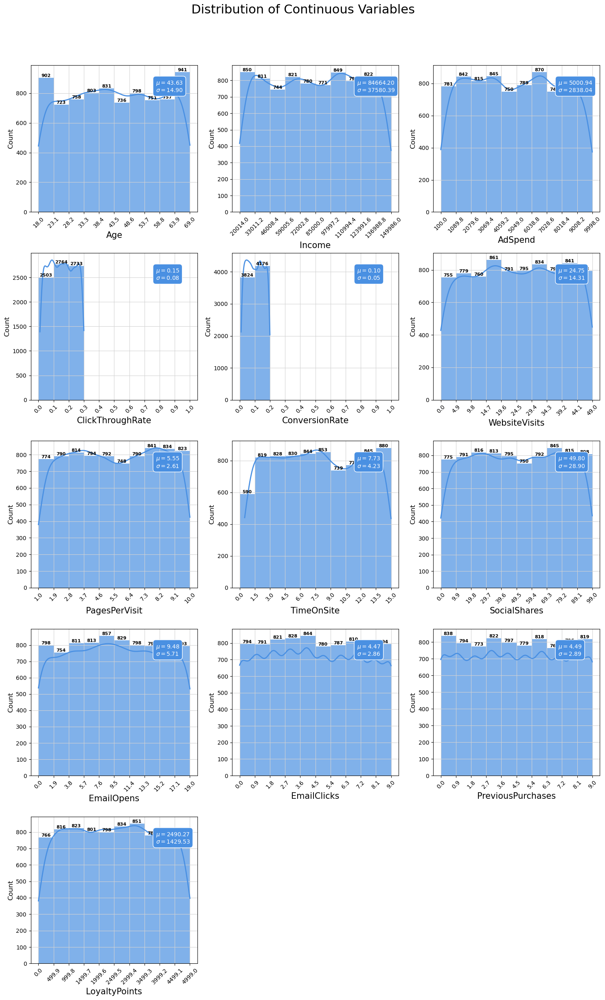

In [10]:
# Filter out continuous features for the univariate analysis
df_continuous = df[continuous_features]

# Calculate number of plots needed
n_features = len(df_continuous.columns)
n_cols = 3
n_rows = (n_features + n_cols - 1) // n_cols  # Auto-adjust rows based on number of features

# Set up the subplot
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 5 * n_rows))
ax = ax.flatten()  # Flatten to simple 1D array for easy indexing

# Loop to plot histograms for each continuous feature
for i, col in enumerate(df_continuous.columns):
    values, bin_edges = np.histogram(df_continuous[col], 
                                     range=(np.floor(df_continuous[col].min()), np.ceil(df_continuous[col].max())))
    
    graph = sns.histplot(data=df_continuous, x=col, bins=bin_edges, kde=True, ax=ax[i],
                         edgecolor='none', color='#4a90e2', alpha=0.7, line_kws={'lw': 2, 'color': '#003366'})
    
    ax[i].set_xlabel(col, fontsize=15)
    ax[i].set_ylabel('Count', fontsize=12)
    ax[i].set_xticks(np.round(bin_edges, 1))
    ax[i].set_xticklabels(ax[i].get_xticks(), rotation=45)
    ax[i].grid(color='lightgrey')
    
    # Annotate counts
    for j, p in enumerate(graph.patches):
        height = p.get_height()
        if height > 0:
            ax[i].annotate(f'{int(height)}', 
                           (p.get_x() + p.get_width() / 2., height), 
                           ha='center', va='bottom', 
                           fontsize=8, fontweight="bold")

    # Mean and Std box
    textstr = '\n'.join((
        r'$\mu=%.2f$' % df_continuous[col].mean(),
        r'$\sigma=%.2f$' % df_continuous[col].std()
    ))
    ax[i].text(0.75, 0.9, textstr, transform=ax[i].transAxes, fontsize=10, verticalalignment='top',
               color='white', bbox=dict(boxstyle='round', facecolor='#4a90e2', edgecolor='white', pad=0.5))

# Turn off any unused subplots
for j in range(i+1, len(ax)):
    ax[j].axis('off')

plt.suptitle('Distribution of Continuous Variables', fontsize=22)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left"> 

<h2 align="left"><font color=red>Inferences:</font></h2>

- <font color="red"><b>Age</b></font>: The age distribution is fairly even, with slight peaks around 20–30 and 60 years. The mean age is approximately **43.63 years**, with a standard deviation of **14.90 years**.

- <font color="red"><b>Income</b></font>: Income shows a broad spread with a slight concentration around lower to middle-income ranges. The mean income is approximately **84,664.20**, and the standard deviation is **37,580.39**, indicating high variability.

- <font color="red"><b>Ad Spend</b></font>: Ad spend distribution is relatively even, with no dominant peak, suggesting varied marketing investments across users. The mean spend is approximately **5,000.94** with a standard deviation of **2,838.04**.

- <font color="red"><b>Click Through Rate</b></font>: Most users have a click-through rate between 0.1 and 0.3. The mean click-through rate is **0.15** with a standard deviation of **0.08**, showing moderate spread around the mean.

- <font color="red"><b>Conversion Rate</b></font>: Conversion rates are mostly concentrated between 0.05 and 0.2. The mean conversion rate is **0.10** with a standard deviation of **0.05**, indicating relatively low variation.

- <font color="red"><b>Website Visits</b></font>: The number of website visits shows a somewhat uniform distribution with a slight peak around 20–30 visits. The mean number of visits is **24.75**, and the standard deviation is **14.31**.

- <font color="red"><b>Pages per Visit</b></font>: Users typically view around 5 pages per visit, with a slight spread around this value. The mean is **5.55** pages per visit, with a standard deviation of **2.61**.

- <font color="red"><b>Time on Site</b></font>: Most users spend between 5–10 minutes on the site. The mean time spent is **7.73 minutes**, with a standard deviation of **4.23 minutes**.

- <font color="red"><b>Social Shares</b></font>: Social shares are highly skewed, with most users sharing content infrequently. The mean number of social shares is **49.80** with a standard deviation of **28.90**, showing high variability.

- <font color="red"><b>Email Opens</b></font>: Email open rates show a fairly uniform distribution across different users. The mean number of opens is **9.48**, with a standard deviation of **5.71**.

- <font color="red"><b>Email Clicks</b></font>: The distribution of email clicks is relatively consistent, centered around 4–5 clicks. The mean is **4.47** clicks with a standard deviation of **2.86**.

- <font color="red"><b>Previous Purchases</b></font>: Most users have 2–4 previous purchases. The mean number of previous purchases is **4.49**, and the standard deviation is **2.89**.

- <font color="red"><b>Loyalty Points</b></font>: Loyalty points distribution is symmetric around the mean of **2,490.27 points** with a high spread, as reflected by the standard deviation of **1,429.53 points**, suggesting significant variation among users.

---

After examining the histograms of the continuous features and comparing them with the provided descriptions, the data seems consistent and falls within expected limits. **No significant noise or unrealistic values were observed among the continuous variables.**

---
</div>




<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.1.2 |</span><span style='color:red; font-size:145%'> Categorical Variables Univariate Analysis</span></b></h4>


In [11]:
# Filter out categorical features for the univariate analysis
categorical_features = ['Gender', 'CampaignChannel', 'CampaignType']
df_categorical = df[categorical_features]
df_categorical.head(8)

,Gender,CampaignChannel,CampaignType
0,Female,Social Media,Awareness
1,Male,Email,Retention
2,Female,PPC,Awareness
3,Female,PPC,Conversion
4,Female,PPC,Conversion
5,Female,Social Media,Awareness
6,Female,Referral,Awareness
7,Female,Social Media,Conversion


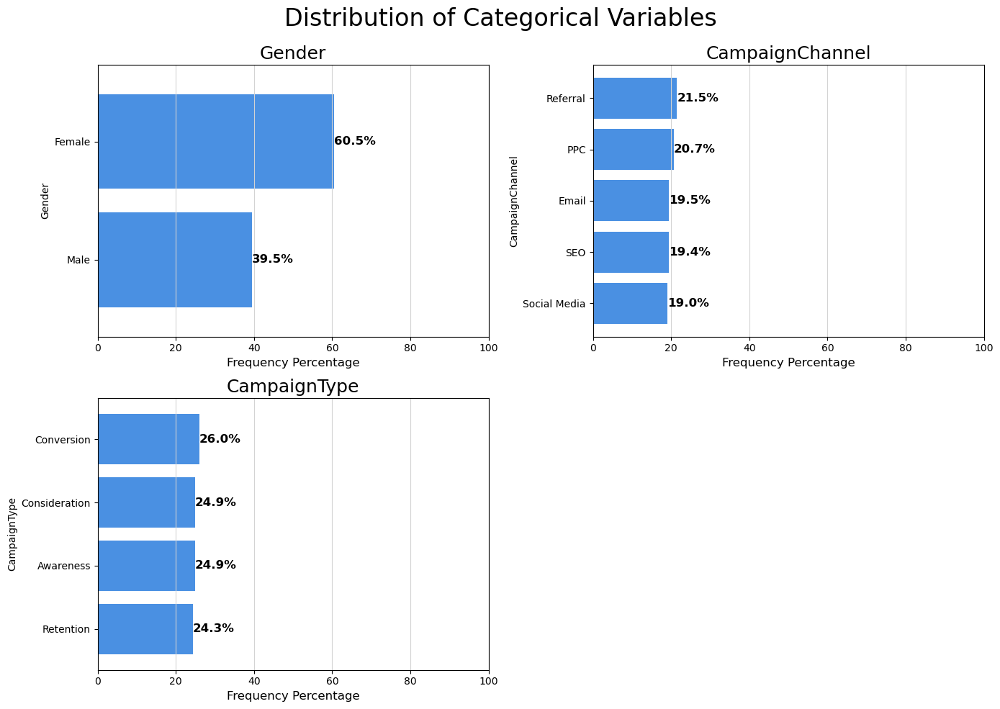

In [12]:
# Set up the subplot for a 2x2 layout
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))

# Flatten the axes array for easier indexing
ax = ax.flatten()

# Loop to plot bar charts for each categorical feature
for i, col in enumerate(categorical_features):
    # Calculate frequency percentages
    value_counts = df[col].value_counts(normalize=True).mul(100).sort_values()
    
    # Plot bar chart with the specified color
    value_counts.plot(kind='barh', ax=ax[i], width=0.8, color='#4a90e2')
    
    # Add frequency percentages to the bars
    for index, value in enumerate(value_counts):
        ax[i].text(value, index, f'{round(value, 1)}%', fontsize=12, weight='bold', va='center')
    
    ax[i].set_xlim([0, 100])
    ax[i].set_xlabel('Frequency Percentage', fontsize=12)
    ax[i].set_title(f'{col}', fontsize=18)
    ax[i].grid(axis='x', color='lightgrey')

# Turn off the last (empty) subplot
ax[3].axis('off')

# Adjust layout
plt.suptitle('Distribution of Categorical Variables', fontsize=24)
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:112%; text-align:left">

<h2 align="left"><font color=red>Inferences:</font></h2>
    
* __Gender (`Gender`)__: The dataset has a higher proportion of **female users (60.5%)**, making up the majority, while **male users (39.5%)** form a smaller segment.

* __Campaign Channel (`CampaignChannel`)__: The distribution of campaign channels is relatively balanced. **Referral** is the most popular channel, accounting for **21.5%**, followed closely by **PPC (20.7%)**, **Email (19.5%)**, **SEO (19.4%)**, and **Social Media (19.0%)**.

* __Campaign Type (`CampaignType`)__: The dataset shows a nearly even distribution across campaign types. **Conversion campaigns** are slightly more common, representing **26.0%**, with **Consideration (24.9%)**, **Awareness (24.9%)**, and **Retention (24.3%)** closely following.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 4.2 |</span><span style='color:red'> Bivariate Analysis</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

For our __bivariate analysis__ of the dataset in relation to the target variable:

* For __continuous variables__, we’ll utilize __bar plots__ to present the mean values of each feature across different target classes, along with __KDE plots__ to explore the distribution patterns for both target categories. These visualizations help highlight how feature values shift between the target outcomes.

* For __categorical variables__, we’ll apply __100% stacked bar charts__ to show the relative proportions of each category within the target groups. This effectively illustrates the categorical distribution across the outcomes.

These visualization strategies will help us uncover meaningful relationships between individual features and the target, potentially identifying strong indicators of heart disease.
</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.2.1 |</span><span style='color:red; font-size:145%'> Numerical Features vs Conversion</span></b></h4>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">
    
To explore how each continuous feature relates to the target variable, I will use two visualization techniques:

* __Bar plots__ – to display the average value of each feature grouped by target category.
* __KDE plots__ – to illustrate the distribution of values for each target class.

</div>


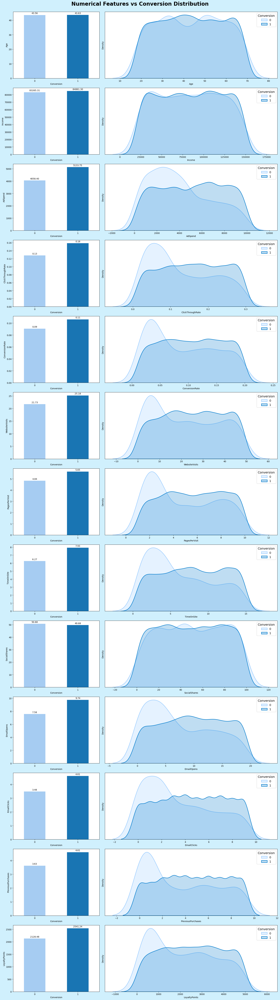

In [13]:
# Define colors for each Conversion category
conversion_colors = {0: '#99ccff', 1: '#007acc'}

# Create the subplots
n_features = len(df_continuous.columns)
fig, ax = plt.subplots(n_features, 2, figsize=(18, 5 * n_features), gridspec_kw={'width_ratios': [1, 2]})

# Ensure ax is 2D
if n_features == 1:
    ax = [ax]  # Make it a list of one pair of axes

# Set background color
fig.patch.set_facecolor('#d0f0fd')

# Loop through each continuous feature
for i, col in enumerate(df_continuous.columns):
    # Precompute mean values grouped by Conversion
    grouped = df.groupby("Conversion")[col].mean().reset_index()

    # Barplot using precomputed values
    graph = sns.barplot(
        x="Conversion", y=col, data=grouped, ax=ax[i][0],
        palette=[conversion_colors[val] for val in grouped["Conversion"]],
        width=0.5
    )
    
    # KDE plots
    sns.kdeplot(
        data=df[df["Conversion"] == 0], x=col, fill=True, linewidth=2, 
        ax=ax[i][1], label='0', color='#99ccff'
    )
    sns.kdeplot(
        data=df[df["Conversion"] == 1], x=col, fill=True, linewidth=2, 
        ax=ax[i][1], label='1', color='#007acc'
    )

    ax[i][1].set_yticks([])
    ax[i][1].legend(
        title='Conversion', 
        loc='upper right', 
        fontsize='13', 
        title_fontsize='14'
    )

    # Add value labels
    for cont in graph.containers:
        graph.bar_label(cont, fmt='%.2f', label_type='edge', padding=3)

# Set title and layout
plt.suptitle('Numerical Features vs Conversion Distribution', fontsize=24, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#0077b6>Inferences:</font></h2>

* __Age (`Age`)__: The average age is nearly identical across both groups—43.56 for non-converters and 43.63 for converters. The distribution overlaps heavily, showing no meaningful difference.  
👉 Age does not significantly impact conversion.

* __Income (`Income`)__: Users who convert have a slightly higher average income (~ 84,861) compared to non-converters (~ 83,265), though the distributions remain largely similar.  
👉 Income shows a mild positive correlation with conversion, but the effect is minimal.

* __Ad Spend (`AdSpend`)__: Converters spend more on advertising on average (~ 5,134) compared to non-converters (~ 4,058), with a noticeable rightward shift in the density plot.  
👉 Higher Ad Spend strongly correlates with increased conversion likelihood.

* __Click Through Rate (`ClickThroughRate`)__: Converters show a higher average CTR (~ 0.16) than non-converters (~ 0.13), with a visibly shifted density curve indicating more active engagement.  
👉 Higher CTR is a strong indicator of conversion behavior.

* __Conversion Rate (`ConversionRate`)__: Converters average a higher Conversion Rate (~ 0.11) than non-converters (~ 0.09). This variable aligns with expectation but offers limited predictive insight.  
👉 Acts as a confirmation metric; mildly supports conversion prediction.

* __Website Visits (`WebsiteVisits`)__: Converters tend to visit the site more frequently (~25.18 vs ~21.73), with a density curve suggesting repeated exposure drives conversion.  
👉 Repeat visits positively influence conversion probability.

* __Pages per Visit (`PagesPerVisit`)__: The average number of pages visited is higher for converters (~ 5.65) than non-converters (~ 4.84). The plot shows a clear rightward shift.  
👉 Users exploring more content per session are more likely to convert.

* __Time on Site (`TimeOnSite`)__: Converters spend significantly more time (approx. 7.93) on site compared to non-converters (approx. 6.27), suggesting higher interest or interaction.  
👉 Longer on-site engagement leads to higher conversion rates.

* __Social Shares (`SocialShares`)__: Both converters and non-converters show nearly identical means (~49–50), with overlapping distributions and no visible distinction.  
👉 Social Shares have negligible impact on conversion behavior.

* __Email Opens (`EmailOpens`)__: Converters tend to open more emails (approx. 9.74) than non-converters (approx. 7.58), with the KDE curve showing a clear rightward shift.  
👉 More email opens reflect greater engagement and conversion likelihood.
  

* __Email Clicks (`EmailClicks`)__: The distribution of email clicks is shifted toward higher values for converters (~4.61 vs ~3.48), indicating stronger interaction.  
👉 Email clicks are a powerful predictor of user conversion.

* __Previous Purchases (`PreviousPurchases`)__: Converters have more past purchases (~4.61 vs ~3.63). The density curve shows a consistent trend favoring converters.  
👉 Users with prior purchases show stronger intent and higher conversion rates.

* __Loyalty Points (`LoyaltyPoints`)__: Users who convert tend to have more loyalty points (~2541.24 vs ~2128.48), with the distribution clearly skewed right.  
👉 Higher loyalty point accumulation strongly aligns with conversion behavior.

____

Based on the observed trends and distribution differences, __Ad Spend__, __Email Clicks__, __Previous Purchases__, and __Time on Site__ emerge as the most impactful predictors of user conversion.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.2.2 |</span><span style='color:red; font-size:145%'> Categorical Features vs Conversion</span></b></h4>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

I will present __100% stacked bar charts__ for each categorical feature, showing the distribution of categories across both conversion classes. Each bar will be labeled with exact counts and percentage values for clarity.
</div>


In [14]:
df_categorical.head()

,Gender,CampaignChannel,CampaignType
0,Female,Social Media,Awareness
1,Male,Email,Retention
2,Female,PPC,Awareness
3,Female,PPC,Conversion
4,Female,PPC,Conversion


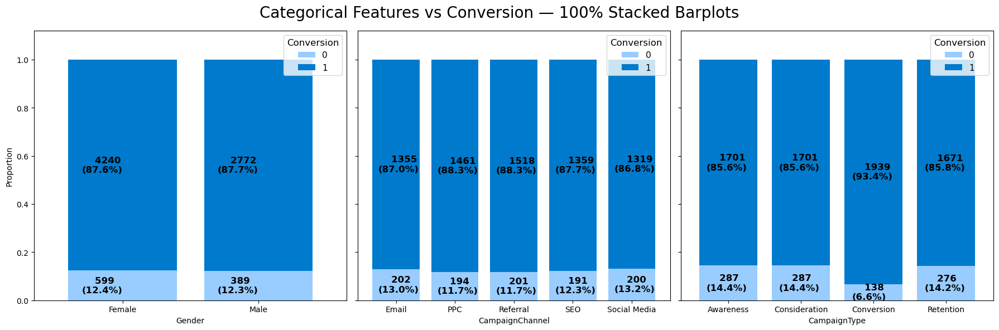

In [15]:
from matplotlib.colors import ListedColormap

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))  # 1 row, 3 columns

for i, col in enumerate(df_categorical[:3]):  # Ensure only 3 features are used
    
    # Cross-tab for counts
    cross_tab = pd.crosstab(index=df[col], columns=df['Conversion'])
    
    # Cross-tab for proportions
    cross_tab_prop = pd.crosstab(index=df[col], columns=df['Conversion'], normalize='index')

    # Define theme colormap
    cmp = ListedColormap(['#99ccff', '#007acc'])
    
    # Plot stacked bar
    cross_tab_prop.plot(kind='bar', ax=ax[i], stacked=True, width=0.8, colormap=cmp,
                        legend=False, ylabel='Proportion', sharey=True)
    
    # Add count and percent labels
    for idx, val in enumerate(cross_tab.index.values):
        for (proportion, count, y_location) in zip(cross_tab_prop.loc[val], cross_tab.loc[val], cross_tab_prop.loc[val].cumsum()):
            ax[i].text(x=idx - 0.3, y=(y_location - proportion) + (proportion / 2) - 0.03,
                       s=f'    {count}\n({np.round(proportion * 100, 1)}%)', 
                       color="black", fontsize=12, fontweight="bold")  # Increased label font size
    
    # Add enlarged legend
    ax[i].legend(title='Conversion', title_fontsize=12, fontsize=11, loc='upper right')  # Increased font sizes

    ax[i].set_ylim([0, 1.12])
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation=0)

plt.suptitle('Categorical Features vs Conversion — 100% Stacked Barplots', fontsize=20)
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d6ecff; font-size:115%; text-align:left">

<h2 align="left"><font color="#007acc">Inferences:</font></h2>

* __Gender__: Both genders show similar conversion rates, with females at **12.4%** and males at **12.3%**. However, the total number of female leads is higher, suggesting slightly more engagement from that segment. Gender does not appear to be a strong differentiator for conversion.

* __CampaignChannel__: Across all channels, conversion rates are relatively low and consistent—ranging from **11.7% (PPC)** to **13.2% (Social Media)**. No particular channel stands out with a significantly higher or lower performance. This indicates uniform conversion performance across marketing channels.

* __CampaignType__: The __Conversion__ campaign type has the **lowest conversion rate** at only **6.6%**, which is notably underperforming. In contrast, other types like __Awareness__, __Consideration__, and __Retention__ all show conversion rates above **14%**, suggesting they are more effective in nurturing leads toward conversion.


____

In summary, based on the visual representation:

* __Higher Impact on Conversion__: `CampaignType` — especially the poor performance of the “Conversion” campaign highlights a critical area for improvement.  
* __Moderate Impact__: `CampaignChannel` — although not dramatic, some slight variances exist that could inform optimization.  
* __Lower Impact__: `Gender` — has very little influence on conversion outcomes.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.3 |</span><span style='color:red; font-size:145%'> Correlation Heatmap </span></b></h4>


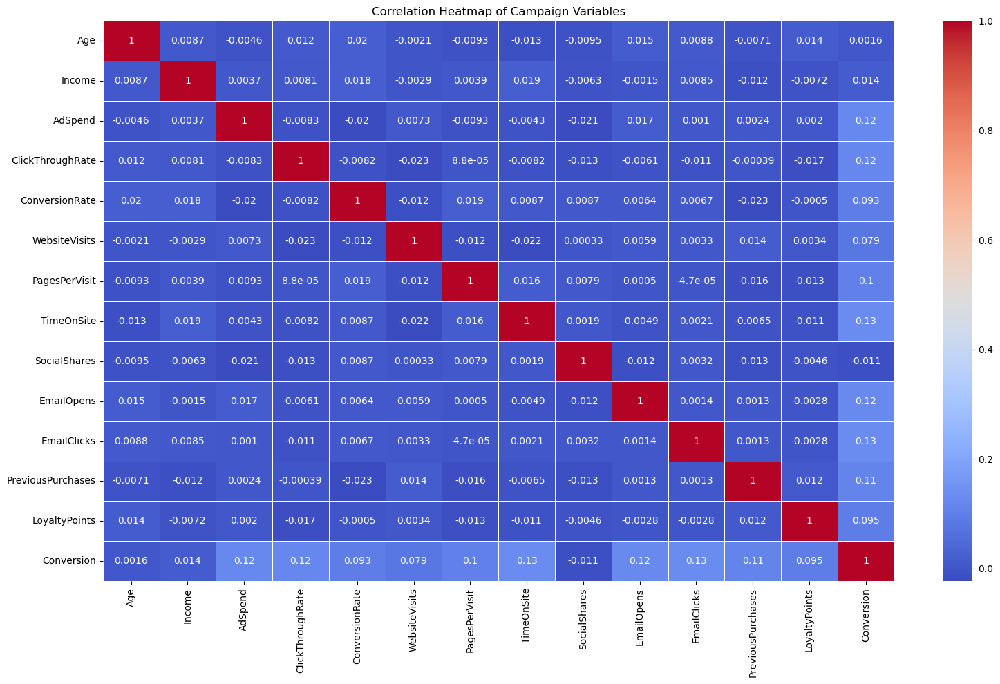

In [16]:
plt.figure(figsize=(16, 10))
corr = df.select_dtypes(include=[np.number]).corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Campaign Variables')
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inferences:</font></h2>

* __Ad Spend, ClickThroughRate, and Email-related features__ (EmailOpens, EmailClicks) show **moderate positive correlation** with `Conversion` (~0.12–0.13), suggesting that increased marketing effort and user engagement may influence conversion rates positively.

* __TimeOnSite__ also has a **notable correlation** (~0.13) with `Conversion`, indicating that users spending more time are more likely to convert.

* __ConversionRate__ itself correlates with `Conversion` at about **0.093**, which is expected since it's a direct metric of campaign effectiveness.

* __LoyaltyPoints__ and __PreviousPurchases__ have **moderate positive correlation** (~0.095–0.11) with `Conversion`, implying customer loyalty and past behavior can be predictive indicators.

* __WebsiteVisits__ and __PagesPerVisit__ show **weaker but noticeable correlations** (~0.079–0.10) with `Conversion`, suggesting some influence from website activity.

* __Age, Income, and SocialShares__ display **negligible correlation** with `Conversion`, indicating they might not be strong predictors in this context.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.4 |</span><span style='color:red; font-size:145%'>Income Distribution by Gender</span></b></h4>


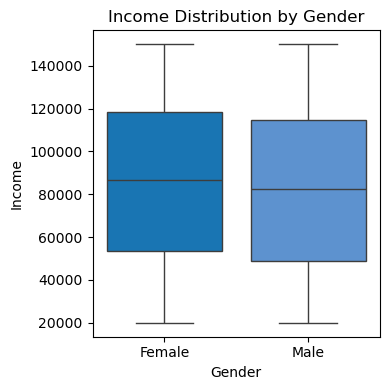

In [17]:
plt.figure(figsize=(4, 4))
sns.boxplot(x='Gender', y='Income', data=df, palette={'Male': '#4a90e2', 'Female': '#007acc'})
plt.title('Income Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Income')
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Box Plot: Income Distribution by Gender</font></h2>

- The box plot shows the distribution of income for both <strong>Male</strong> and <strong>Female</strong> groups.  
- Both genders have a similar income distribution in terms of range and spread.  
- The <strong>median income</strong> (the horizontal line inside the box) for females is slightly higher than that for males.  
- The <strong>interquartile range (IQR)</strong> — which is the middle 50% of the data — is almost the same for both genders.  
- The <strong>minimum and maximum income values</strong> (represented by the whiskers) are nearly identical, indicating comparable income variability.  
- There are <strong>no significant outliers</strong> present in either gender group.  

<strong>Conclusion</strong>: Income distribution between males and females is quite balanced, with a slightly higher median for females.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.5 |</span><span style='color:red; font-size:145%'>Conversion Rate by Campaign Type </span></b></h4>


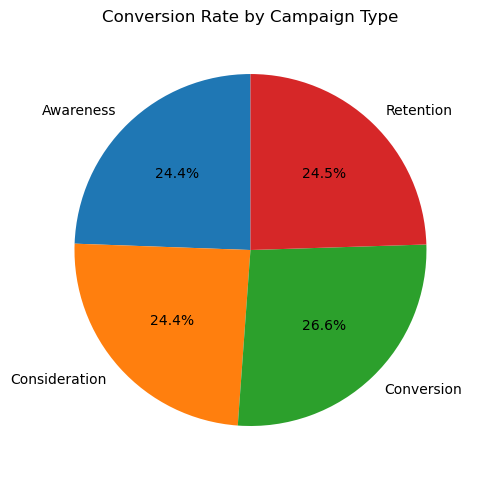

In [22]:
conversion_by_type = df.groupby('CampaignType')['Conversion'].mean()
conversion_by_type.plot.pie(
    autopct='%1.1f%%',
    startangle=90,
    figsize=(5, 5),
    ylabel='',
    colors=sns.color_palette("tab10")
)
plt.title('Conversion Rate by Campaign Type')
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Pie Chart: Conversion Rate by Campaign Type</font></h2>

- The pie chart visualizes the distribution of conversion rates across four different campaign types: <strong>Awareness</strong>, <strong>Consideration</strong>, <strong>Conversion</strong>, and <strong>Retention</strong>.
- The <strong>Conversion</strong> campaign type holds the highest share, contributing <strong>26.6%</strong> to the overall conversion rate.
- <strong>Retention</strong> campaigns contribute slightly less at <strong>24.5%</strong>, followed closely by <strong>Consideration</strong> and <strong>Awareness</strong> with nearly equal shares of <strong>24.4%</strong> each.
- The values are fairly close across all campaign types, indicating a balanced contribution, but the slight edge of the Conversion campaign suggests it is the most effective among the four.

<strong>Conclusion</strong>: While all campaign types contribute similarly to conversions, <strong>Conversion-focused campaigns</strong> appear to be slightly more effective, making them a strategic focus for improving overall conversion rates.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.6 |</span><span style='color:red; font-size:145%'> Website Engagement Metrics</span></b></h4>


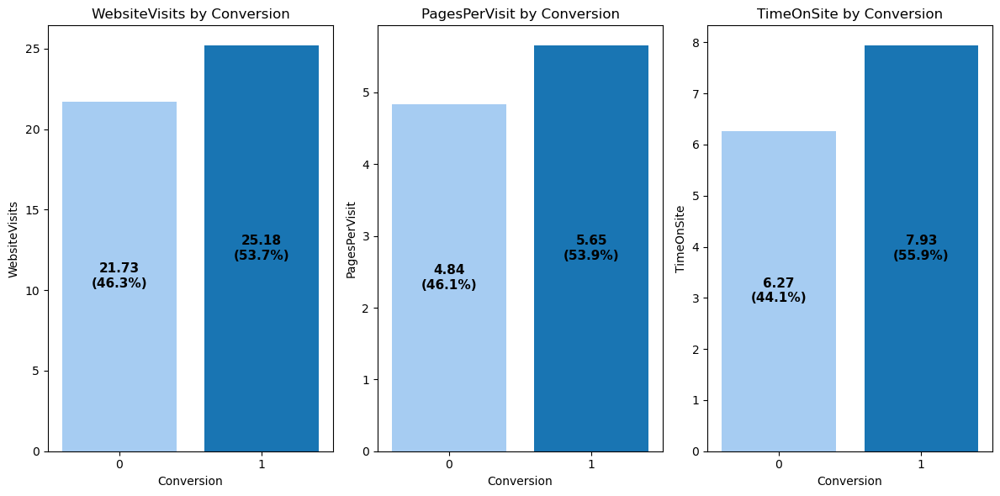

In [23]:
# List of engagement metrics
engagement_metrics = ['WebsiteVisits', 'PagesPerVisit', 'TimeOnSite']

# Define color mapping
conversion_colors = {0: '#99ccff', 1: '#007acc'}

# Set up subplots
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# Loop through each metric and plot a barplot
for i, metric in enumerate(engagement_metrics):
    # Calculate the mean of each metric by Conversion
    mean_data = df.groupby('Conversion')[metric].mean().reset_index()

    # Create a palette list based on the Conversion values in mean_data
    palette = [conversion_colors[val] for val in mean_data['Conversion']]

    # Create a bar plot with custom colors
    ax = sns.barplot(x='Conversion', y=metric, data=mean_data, ax=axes[i], palette=palette)
    
    # Add percentage inside the bars
    for p in ax.patches:
        height = p.get_height()
        percentage = (height / mean_data[metric].sum()) * 100
        # Annotate percentage inside the bar
        ax.annotate(f'{height:.2f}\n({percentage:.1f}%)', 
                    (p.get_x() + p.get_width() / 2., height / 2),  # Position inside the bar
                    ha='center', va='center', fontsize=11, color='black', weight='bold')  # White text for visibility

    # Set titles and labels
    axes[i].set_title(f'{metric} by Conversion')
    axes[i].set_xlabel('Conversion')
    axes[i].set_ylabel(metric)

# Adjust layout
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Charts: User Engagement Metrics by Conversion Status</font></h2>

- The bar charts compare three key user engagement metrics—<strong>Website Visits</strong>, <strong>Pages Per Visit</strong>, and <strong>Time on Site</strong>—between users who converted and those who did not.
  
- Users who <strong>converted</strong> had a higher average number of website visits (<strong>25.18</strong>) compared to non-converters (<strong>21.73</strong>), indicating that repeated visits are associated with increased likelihood of conversion.

- <strong>Pages viewed per visit</strong> were also higher for converting users (<strong>5.65</strong>) than for non-converters (<strong>4.84</strong>), suggesting deeper content engagement contributes to conversions.

- In terms of <strong>time spent on site</strong>, converters stayed longer (<strong>7.93 units</strong>) than non-converters (<strong>6.27 units</strong>), reinforcing that higher engagement duration correlates with better conversion outcomes.

<strong>Conclusion</strong>: Higher levels of user engagement—measured by frequency of visits, depth of exploration, and time spent—are positively associated with conversion, emphasizing the value of optimizing user experience to drive results.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.7 |</span><span style='color:red; font-size:145%'> Conversion by Gender</span></b></h4>


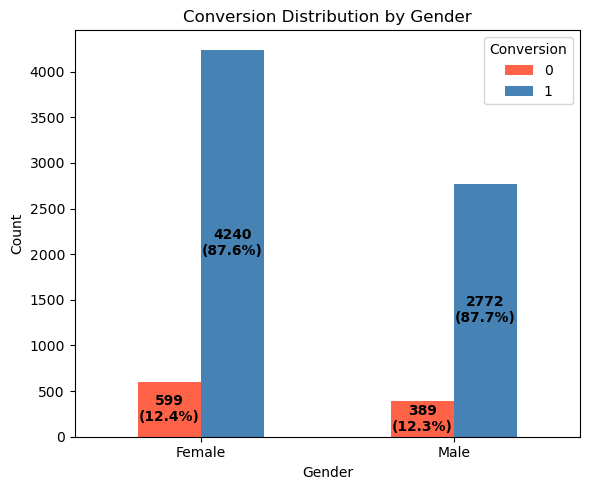

In [24]:
# Group and unstack to get counts
conversion_gender = df.groupby(['Gender', 'Conversion']).size().unstack()

# Plot the bar chart
ax = conversion_gender.plot(kind='bar', figsize=(6, 5), color=['#FF6347', '#4682B4'])

# Title and labels
plt.title('Conversion Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=0)

# Annotate bars with count and percentage inside the bars
for i, container in enumerate(ax.containers):
    for j, bar in enumerate(container):
        height = bar.get_height()
        if height > 0:
            # Total count for this gender
            gender = conversion_gender.index[j]
            total = conversion_gender.loc[gender].sum()
            percent = (height / total) * 100
            # Annotate count and percentage inside the bar
            ax.annotate(f'{int(height)}\n({percent:.1f}%)',
                        (bar.get_x() + bar.get_width() / 2, height / 2),  # Position inside the bar (halfway)
                        ha='center', va='center', fontsize=10, fontweight='bold', color='black')

# Show the plot
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Chart: Conversion Distribution by Gender</font></h2>

- The bar chart displays the distribution of conversions between <strong>Female</strong> and <strong>Male</strong> users, segmented by conversion status (0 = not converted, 1 = converted).

- Among <strong>female users</strong>, <strong>87.6%</strong> (4240) converted, while <strong>12.4%</strong> (599) did not.

- Among <strong>male users</strong>, <strong>87.7%</strong> (2772) converted, and <strong>12.3%</strong> (389) did not.

- The conversion percentages between genders are nearly identical, with a negligible difference of 0.1%.

<strong>Conclusion</strong>: Conversion behavior is consistent across genders, indicating that gender does not significantly influence conversion rates in this dataset.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.8 |</span><span style='color:red; font-size:145%'> Conversion by Campaign Channel</span></b></h4>


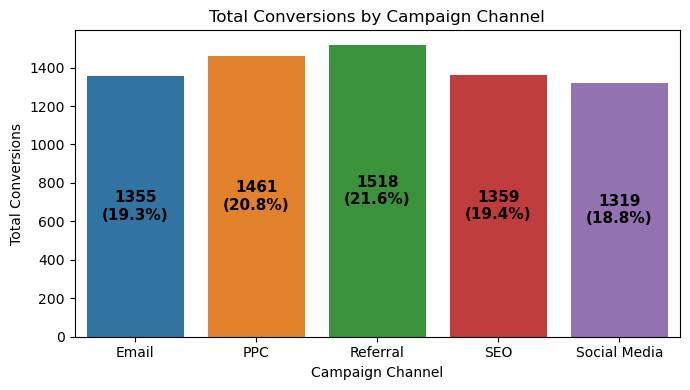

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the total conversions per campaign channel
campaign_channels = df.groupby('CampaignChannel')['Conversion'].sum().reset_index()

# Rename columns
campaign_channels.columns = ['CampaignChannel', 'TotalConversions']

# Calculate total count for percentages
total_conversions = campaign_channels['TotalConversions'].sum()

# Create barplot
plt.figure(figsize=(7, 4))
ax = sns.barplot(data=campaign_channels, x='CampaignChannel', y='TotalConversions', palette='tab10')

# Add sum and percentage inside the bars
for p in ax.patches:
    total = int(p.get_height())
    percent = (total / total_conversions) * 100
    ax.annotate(f'{total}\n({percent:.1f}%)',
                (p.get_x() + p.get_width() / 2., p.get_height() * 0.5),  # Halfway up the bar
                ha='center', va='center', fontsize=11, color='black', weight='bold')

# Titles and labels
plt.title("Total Conversions by Campaign Channel")
plt.xlabel("Campaign Channel")
plt.ylabel("Total Conversions")
plt.tight_layout()
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Chart: Conversions by Campaign Channel</font></h2>

- The bar chart illustrates the number of conversions attributed to five different campaign channels: <strong>Referral</strong>, <strong>PPC</strong>, <strong>Email</strong>, <strong>SEO</strong>, and <strong>Social Media</strong>.

- The <strong>Referral</strong> channel leads with the highest number of conversions at <strong>1518</strong> (21.6%).

- <strong>PPC</strong> follows with <strong>1461</strong> conversions (20.8%).

- <strong>SEO</strong> and <strong>Email</strong> contribute similarly with <strong>1359</strong> (19.4%) and <strong>1355</strong> (19.3%) conversions, respectively.

- <strong>Social Media</strong> shows the lowest conversion count at <strong>1319</strong> (18.8%).

<strong>Conclusion</strong>: All campaign channels contribute significantly to overall conversions, with <strong>Referral campaigns</strong> showing a slight advantage in performance, indicating higher effectiveness in driving conversions.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.9 |</span><span style='color:red; font-size:145%'> Conversions per Campaign Channel</span></b></h4>


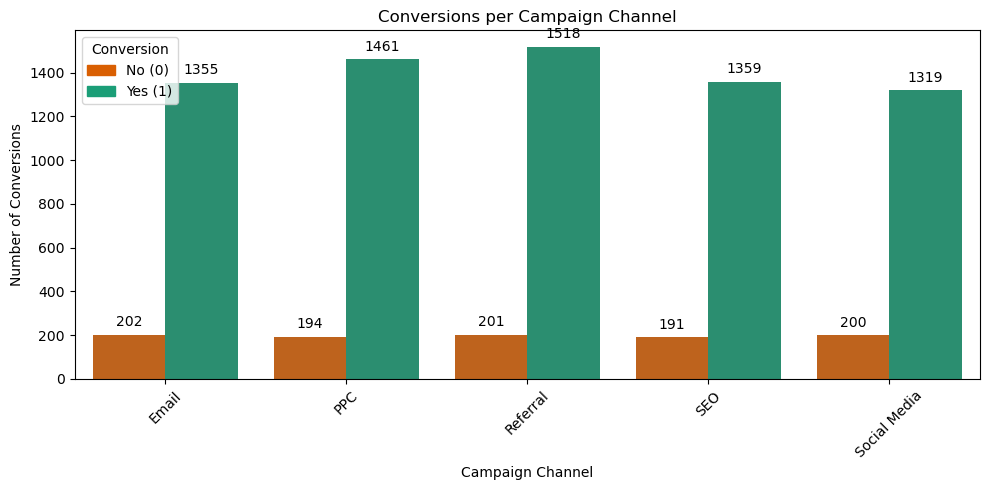

In [26]:
import matplotlib.patches as mpatches

# Prepare the data: group and count conversions
conversion_counts = df.groupby(['CampaignChannel', 'Conversion']).size().reset_index(name='Count')

# Create barplot
plt.figure(figsize=(10, 5))
ax = sns.barplot(data=conversion_counts, x='CampaignChannel', y='Count', hue='Conversion', palette=['#d95f02', '#1b9e77'])

# Annotate each bar with its count
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom',
                    fontsize=10, color='black',
                    xytext=(0, 4), textcoords='offset points')

# Custom legend with matching colors
legend_handles = [
    mpatches.Patch(color='#d95f02', label='No (0)'),
    mpatches.Patch(color='#1b9e77', label='Yes (1)')
]
plt.legend(title='Conversion', handles=legend_handles)

# Add titles and labels
plt.title('Conversions per Campaign Channel')
plt.xlabel('Campaign Channel')
plt.ylabel('Number of Conversions')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Chart: Conversions per Campaign Channel</font></h2>

- The chart breaks down conversions (Yes vs. No) for each campaign channel: <strong>Email</strong>, <strong>PPC</strong>, <strong>Referral</strong>, <strong>SEO</strong>, and <strong>Social Media</strong>.

- <strong>Referral</strong> again leads with the highest number of successful conversions at <strong>1518</strong>, followed by <strong>PPC</strong> with <strong>1461</strong>, and <strong>Email</strong> with <strong>1355</strong>.

- The <strong>Social Media</strong> and <strong>SEO</strong> channels have slightly lower conversion counts at <strong>1319</strong> and <strong>1359</strong>, respectively.

- All channels have relatively low numbers of non-conversions, with figures ranging between <strong>191</strong> and <strong>202</strong>.

<strong>Conclusion</strong>: While all campaign channels perform well, <strong>Referral</strong> and <strong>PPC</strong> campaigns demonstrate the highest effectiveness in driving conversions, with consistently low non-conversion rates across all channels.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.10 |</span><span style='color:red; font-size:145%'> Gender Distribution by Campaign Channel</span></b></h4>


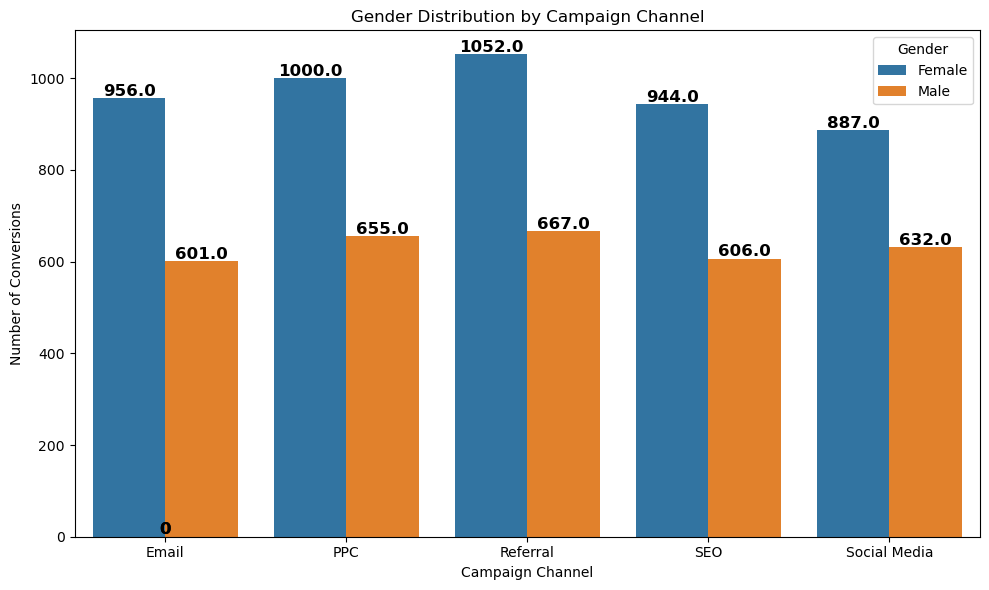

In [27]:
# Get gender distribution by campaign channel
campaign_gender_counts = df.groupby(['CampaignChannel', 'Gender']).size().reset_index(name='Count')

# Create barplot
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=campaign_gender_counts, x='CampaignChannel', y='Count', hue='Gender', palette='tab10')

# Add numbers on top of the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', fontsize=12, color='black', weight='bold', xytext=(0, 5), textcoords='offset points')

# Titles and labels
plt.title("Gender Distribution by Campaign Channel")
plt.xlabel("Campaign Channel")
plt.ylabel("Number of Conversions")
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Chart: Gender Distribution by Campaign Channel</font></h2>

- Across all campaign channels, <strong>females</strong> consistently show higher conversion counts than <strong>males</strong>.
- The <strong>Referral</strong> channel leads for both genders, with <strong>1052</strong> female and <strong>667</strong> male conversions.
- <strong>Email</strong> campaigns have the lowest male conversions (<strong>601</strong>) and also exhibit the widest gender gap.
- Gender differences are less pronounced in <strong>Referral</strong> and <strong>Social Media</strong> compared to other channels.

<strong>Conclusion</strong>: Female users convert more than males across all campaign channels, with <strong>Referral</strong> being the top-performing channel for both genders.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.11 |</span><span style='color:red; font-size:145%'> Campaign Channel Distribution by Gender</span></b></h4>


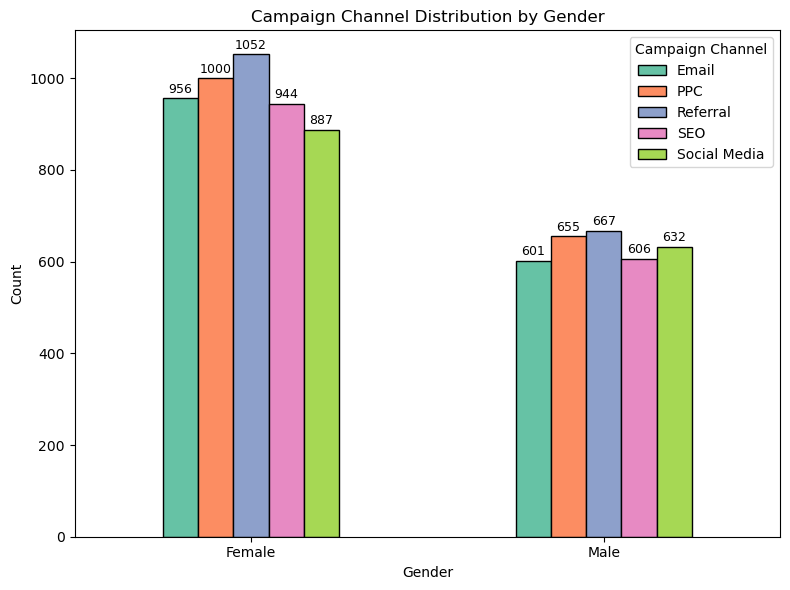

In [28]:
# Group data by Gender and CampaignChannel
channel_gender = df.groupby(['Gender', 'CampaignChannel']).size().unstack()

# Plot the grouped bar chart with custom colors
ax = channel_gender.plot(kind='bar', figsize=(8, 6), color=plt.cm.Set2.colors, edgecolor='black')

# Add value labels on each bar
for container in ax.containers:
    ax.bar_label(container, fmt='%d', label_type='edge', fontsize=9, padding=2)

# Chart formatting
plt.title('Campaign Channel Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Campaign Channel')
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=blue>Inference from Bar Chart: Campaign Channel Distribution by Gender</font></h2>

- <strong>Referral</strong> is the most preferred channel for both females (1052) and males (667).
- Female conversions are higher than male conversions across all campaign channels.
- <strong>Email</strong> and <strong>Social Media</strong> show the lowest gender conversion counts for both genders.
- Gender gap is relatively narrowest in <strong>Social Media</strong>.

<strong>Conclusion</strong>: Referral campaigns perform best across genders, while Social Media shows more balanced gender engagement.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.12 |</span><span style='color:red; font-size:145%'> Age Group Distribution & Conversion Distribution by Age Group</span></b></h4>


In [29]:
df_copy = df.copy()  # making a copy of dataset

In [30]:
# Define bins and labels
bins = [0, 18, 25, 35, 45, 55, 65, np.inf]
labels = ['<18', '18-25', '26-35', '36-45', '46-55', '56-65', '65+']

# Create AgeGroup column
df_copy['AgeGroup'] = pd.cut(df_copy['Age'], bins=bins, labels=labels)

# Convert to string type
df_copy['AgeGroup'] = df_copy['AgeGroup'].astype(str)

# Check distribution
df_copy['AgeGroup'].value_counts()

AgeGroup
36-45    1603
46-55    1536
56-65    1529
26-35    1522
18-25    1045
65+       617
<18       148
Name: count, dtype: int64

<a id="basic"></a>
<h4><b><span style='color:red; font-size:145%'> Age Group Distribution</span></b></h4>

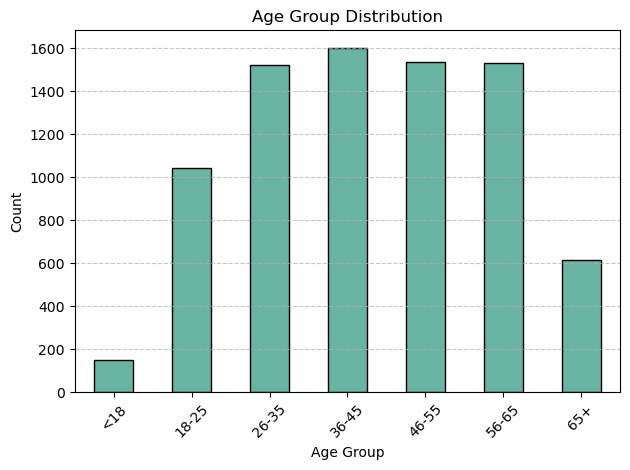

In [31]:
# Define custom order for age groups
age_order = ['<18', '18-25', '26-35', '36-45', '46-55', '56-65', '65+']

# Ensure 'AgeGroup' is a categorical with correct order
df_copy['AgeGroup'] = pd.Categorical(df_copy['AgeGroup'], categories=age_order, ordered=True)

# Bar plot in specified order
df_copy['AgeGroup'].value_counts().reindex(age_order).plot(
    kind='bar',
    color='#69b3a2',
    edgecolor='black'
)

plt.title('Age Group Distribution')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#006699>Inference from Bar Chart: Age Group Distribution</font></h2>

- The highest engagement is seen in the <strong>36–45</strong> age group (1600).
- Age groups from <strong>26–65</strong> show consistently high participation, all around ~1500.
- The <strong>&lt;18</strong> age group has the lowest count, indicating minimal engagement.
- The <strong>65+</strong> group shows moderate activity (around 600), higher than <18 but well below prime age groups.

<strong>Conclusion</strong>: Targeting campaigns toward ages <strong>26–65</strong>, especially 36–45, is optimal for reach and engagement.

</div>


<a id="basic"></a>
<h4><b><span style='color:red; font-size:145%'> Conversion Distribution by Age Group</span></b></h4>

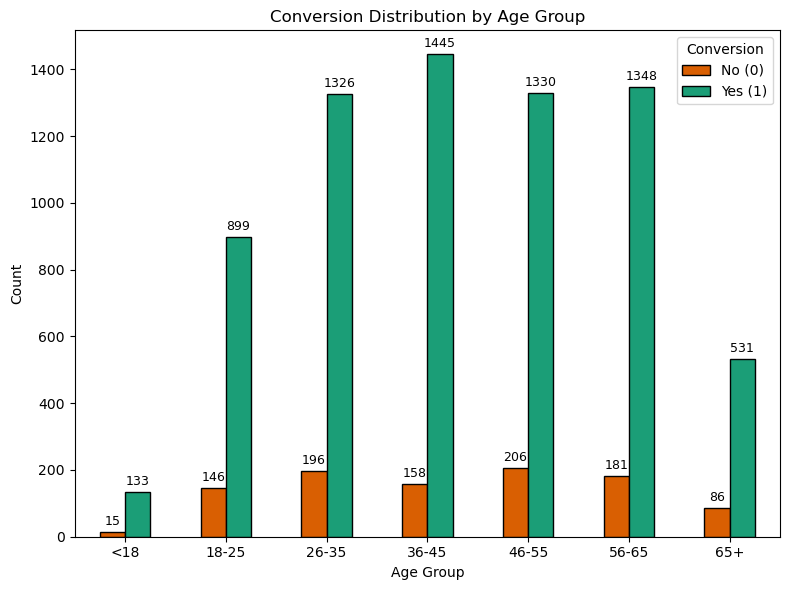

In [32]:
# Group by AgeGroup and Conversion
conversion_age = df_copy.groupby(['AgeGroup', 'Conversion']).size().unstack()

# Plot with custom colors
ax = conversion_age.plot(kind='bar', figsize=(8, 6), color=['#d95f02', '#1b9e77'], edgecolor='black')

# Add value labels on each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}', 
                    (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='bottom',
                    fontsize=9, color='black',
                    xytext=(0, 3), textcoords='offset points')

# Labels and formatting
plt.title('Conversion Distribution by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Conversion', labels=['No (0)', 'Yes (1)'])
plt.tight_layout()
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#004466>Inference from Bar Chart: Conversion Distribution by Age Group</font></h2>

- Highest conversions are from the <strong>36–45</strong> age group (1445), followed closely by 46–55 and 56–65.
- Age groups <strong>26–65</strong> dominate conversions, indicating strong engagement and conversion potential.
- Conversion rates are very low in <strong>&lt;18</strong> and significantly lower in <strong>65+</strong> compared to prime age groups.
- Despite some non-conversions, the net positive conversion rate is substantial for all groups between 26–65.

<strong>Conclusion</strong>: Focus campaign efforts on the <strong>26–65</strong> age range to maximize conversion rates.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.13 |</span><span style='color:red; font-size:145%'> First-Time Customer Conversion Distribution </spa></b></h4>

In [33]:
new_customers=df[df['PreviousPurchases']==0]
new_customer_conversions= new_customers["Conversion"].sum()
total_new_customers=len(new_customers)
first_time_conversion_rate = (new_customer_conversions / total_new_customers) * 100

print(f"Total new customers: {total_new_customers}")
print(f"Total conversions from new customers: {new_customer_conversions}")
print(f"First-time conversion rate: {first_time_conversion_rate:.2f}%")

Total new customers: 838
Total conversions from new customers: 648
First-time conversion rate: 77.33%


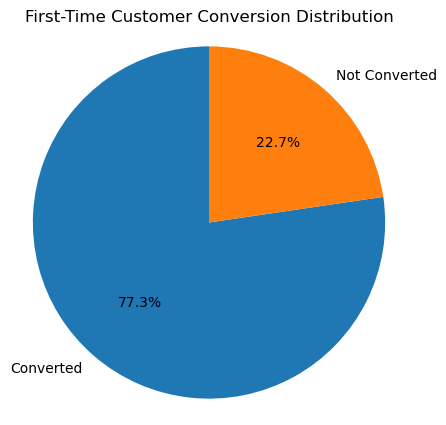

In [34]:
labels = ["Converted", "Not Converted"]
values = [new_customer_conversions, total_new_customers - new_customer_conversions]

colors = ['#1f77b4', '#ff7f0e']  # Example colors from 'tab10'

plt.figure(figsize=(5, 5))
plt.pie(values, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)

plt.title("First-Time Customer Conversion Distribution")
plt.axis('equal')

plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#006699>Inference from Pie Chart: First-Time Customer Conversion</font></h2>

- A significant majority of first-time customers have <strong>converted (77.3%)</strong>.
- Only <strong>22.7%</strong> did not convert, reflecting low drop-off at initial interaction.
- The high conversion rate suggests an effective <strong>onboarding process</strong> and strong initial customer interest.

<strong>Conclusion</strong>: First-touch strategies are highly successful; maintaining or enhancing early-stage engagement can drive continued growth.

</div>


<a id="basic"></a>
<h4><b><span style='color:blue; font-size:145%'>Step 4.14 |</span><span style='color:red; font-size:145%'> Conversion Distribution by Income Group </spa></b></h4>

In [35]:
income_bins=[20000,50000,100000,150001]
income_labels=['Low','Medium','High']
df_copy['IncomeGroup']=pd.cut(df_copy['Income'], bins=income_bins, labels=income_labels, right=False)

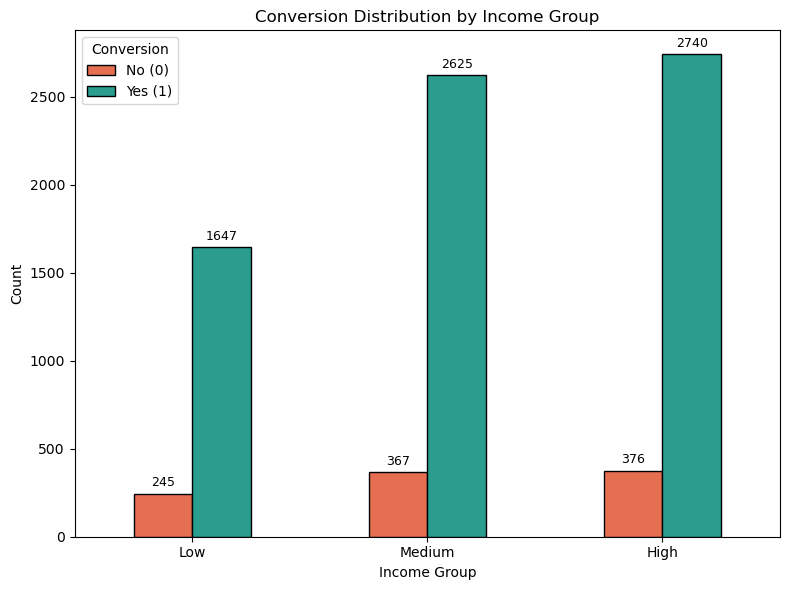

In [36]:
import matplotlib.pyplot as plt

# Group by IncomeGroup and Conversion
conversion_income = df_copy.groupby(['IncomeGroup', 'Conversion']).size().unstack()

# Plot with custom colors
ax = conversion_income.plot(kind='bar', figsize=(8, 6), color=['#e76f51', '#2a9d8f'], edgecolor='black')

# Add value labels to each bar
for p in ax.patches:
    height = p.get_height()
    if height > 0:
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom',
                    fontsize=9, color='black',
                    xytext=(0, 3), textcoords='offset points')

# Titles and labels
plt.title('Conversion Distribution by Income Group')
plt.xlabel('Income Group')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Conversion', labels=['No (0)', 'Yes (1)'])
plt.tight_layout()
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#006699>Inference from Bar Chart: Conversion by Income Group</font></h2>

- Conversion increases with income: <strong>High income group</strong> has the most conversions (2740), followed by Medium (2625) and Low (1647).
- Non-conversions are also highest in the High income group (376), but proportionally lower than conversions.
- All income segments show strong conversion trends, especially in higher tiers.

<strong>Conclusion</strong>: Higher income groups exhibit better conversion performance; tailoring premium campaigns to them could yield strong returns.

</div>


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 5 | Data Preprocessing </p>


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.1 |</span><span style='color:red'> Irrelevant Features Removal</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

As part of our initial data cleaning, we removed the `CustomerID`, `AdvertisingPlatform`, and `AdvertisingTool` columns, as they were deemed irrelevant for analysis and prediction purposes.

Following the exploratory data analysis (EDA), all remaining features appear to contribute meaningful information. None of the columns seem redundant or insignificant. Given the relatively small size of the dataset, we will retain all remaining features to preserve potentially valuable insights.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.2 |</span><span style='color:red'> Checking Duplicates</span></b>


In [37]:
# Check for duplicate rows
duplicates = df.duplicated()

# Count total duplicates
num_duplicates = duplicates.sum()
print(f"Number of duplicate rows: {num_duplicates}")

Number of duplicate rows: 0


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">
No duplicate rows were found in the dataset.
</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.2 |</span><span style='color:red'> Missing Value Treatment</span></b>


In [38]:
# Check for missing values in the dataset
df.isnull().sum().sum()

0

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

Based on the inspection above, our dataset contains no missing values. This is advantageous, as it eliminates the need for imputation or row removal — processes that could introduce bias or further reduce the size of an already limited dataset.

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.3 |</span><span style='color:red'> Outlier Treatment</span></b>


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

I will now identify outliers in the continuous features using the __Interquartile Range (IQR) method__.

</div>


In [39]:
continuous_features

['Age',
 'Income',
 'AdSpend',
 'ClickThroughRate',
 'ConversionRate',
 'WebsiteVisits',
 'PagesPerVisit',
 'TimeOnSite',
 'SocialShares',
 'EmailOpens',
 'EmailClicks',
 'PreviousPurchases',
 'LoyaltyPoints']

In [40]:
Q1 = df[continuous_features].quantile(0.25)
Q3 = df[continuous_features].quantile(0.75)
IQR = Q3 - Q1
outliers_count_specified = ((df[continuous_features] < (Q1 - 1.5 * IQR)) | (df[continuous_features] > (Q3 + 1.5 * IQR))).sum()

outliers_count_specified

Age                  0
Income               0
AdSpend              0
ClickThroughRate     0
ConversionRate       0
WebsiteVisits        0
PagesPerVisit        0
TimeOnSite           0
SocialShares         0
EmailOpens           0
EmailClicks          0
PreviousPurchases    0
LoyaltyPoints        0
dtype: int64

<Figure size 1500x800 with 0 Axes>

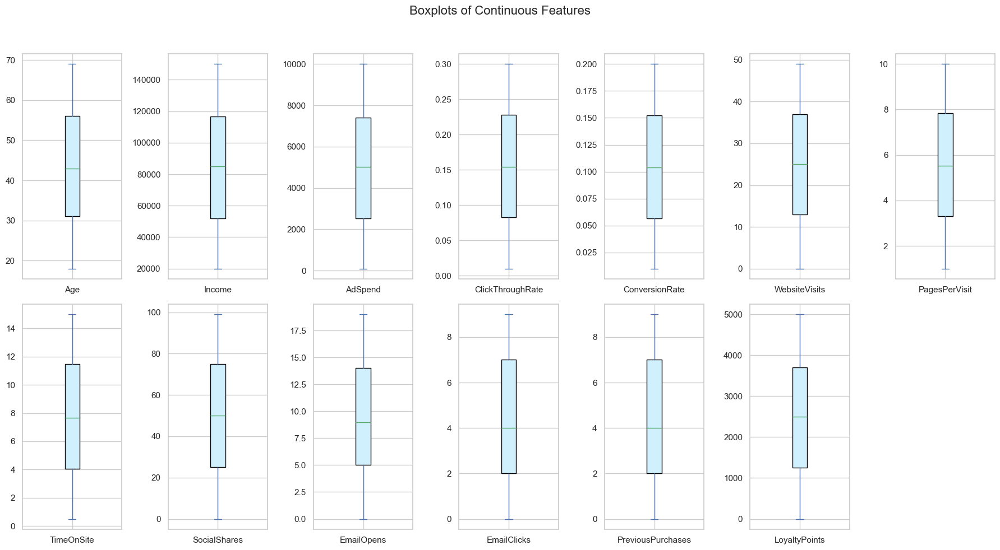

In [41]:
# Set up the plotting area
plt.figure(figsize=(15, 8))
sns.set(style="whitegrid")

# Create boxplots for each continuous feature
df[continuous_features].plot(kind='box', subplots=True, layout=(2, int(len(continuous_features)/2) + 1),
                             figsize=(18, 10), patch_artist=True, boxprops=dict(facecolor='#d0f0fd'))

plt.suptitle('Boxplots of Continuous Features', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

- The boxplots of all continuous features, such as `Age`, `Income`, `AdSpend`, `ClickThroughRate`, etc., display well-centered distributions with no extreme outliers visually present.  
- Upon confirming with the IQR-based statistical method, **none of the continuous features contain outliers** (all counts are 0), reinforcing the boxplot interpretation.  
- This suggests that the dataset is **clean and free from anomalies** for the continuous variables, which simplifies preprocessing and reduces the need for outlier handling.  
- Having no outliers helps ensure **robustness in modeling**, avoiding skewed results caused by extreme values.  

</div>


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.4 |</span><span style='color:red'> Categorical Features Encoding</span></b>


In [42]:
categorical_features

['Gender', 'CampaignChannel', 'CampaignType']

<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:112%; text-align:left">

<h3 align="left"><font color=blue>One-hot Encoding Decision for Categorical Features:</font></h3>

To avoid introducing any ordinal assumptions into categorical features and to maintain consistent preprocessing, one-hot encoding is applied to all categorical variables, including binary ones.

1. **Nominal Variables**: These are variables with no inherent order. They should be one-hot encoded because using them as numbers might introduce an unintended order to the model.

2. **Ordinal Variables**: These variables have an inherent order. They don't necessarily need to be one-hot encoded since their order can provide meaningful information to the model.


- While binary features like `Gender` can be label encoded (e.g., Male=0, Female=1), applying one-hot encoding ensures consistency and avoids any implicit bias from ordinal treatment. It also supports compatibility with models sensitive to feature scaling or numerical values.

Given this approach:

- __`Gender`__: Although binary, it will be one-hot encoded to preserve model-agnostic representation and ensure equal treatment of both categories.
- __`CampaignChannel`__: This is nominal with multiple categories (e.g., Email, Social Media, TV, etc.) and will be one-hot encoded.
- __`CampaignType`__: Also nominal with multiple types (e.g., Promotional, Informational, etc.) and will be one-hot encoded.

<h4 align="left">Summary:</h4>

- __Apply One-Hot Encoding__: __`Gender`__, __`CampaignChannel`__, __`CampaignType`__

</div>


<a id="basic"></a>
# <b><span style='color:red'> For Gender, CampaignChannel and CampaignType </span></b>


In [43]:
# Perform one-hot encoding and convert boolean to integer (0/1)
df = pd.get_dummies(df, columns=['Gender','CampaignChannel', 'CampaignType'], drop_first=False)
df[df.select_dtypes(include=['bool']).columns] = df.select_dtypes(include=['bool']).astype(int)

In [44]:
df.head(4)

,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,...,Gender_Male,CampaignChannel_Email,CampaignChannel_PPC,CampaignChannel_Referral,CampaignChannel_SEO,CampaignChannel_Social Media,CampaignType_Awareness,CampaignType_Consideration,CampaignType_Conversion,CampaignType_Retention
0,56,136912,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,...,0,0,0,0,0,1,1,0,0,0
1,69,41760,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,...,1,1,0,0,0,0,0,0,0,1
2,46,88456,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,...,0,0,1,0,0,0,1,0,0,0
3,32,44085,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,...,0,0,1,0,0,0,0,0,1,0


In [45]:
df.columns

Index(['Age', 'Income', 'AdSpend', 'ClickThroughRate', 'ConversionRate',
       'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite', 'SocialShares',
       'EmailOpens', 'EmailClicks', 'PreviousPurchases', 'LoyaltyPoints',
       'Conversion', 'Gender_Female', 'Gender_Male', 'CampaignChannel_Email',
       'CampaignChannel_PPC', 'CampaignChannel_Referral',
       'CampaignChannel_SEO', 'CampaignChannel_Social Media',
       'CampaignType_Awareness', 'CampaignType_Consideration',
       'CampaignType_Conversion', 'CampaignType_Retention'],
      dtype='object')

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Age                           8000 non-null   int64  
 1   Income                        8000 non-null   int64  
 2   AdSpend                       8000 non-null   float64
 3   ClickThroughRate              8000 non-null   float64
 4   ConversionRate                8000 non-null   float64
 5   WebsiteVisits                 8000 non-null   int64  
 6   PagesPerVisit                 8000 non-null   float64
 7   TimeOnSite                    8000 non-null   float64
 8   SocialShares                  8000 non-null   int64  
 9   EmailOpens                    8000 non-null   int64  
 10  EmailClicks                   8000 non-null   int64  
 11  PreviousPurchases             8000 non-null   int64  
 12  LoyaltyPoints                 8000 non-null   int64  
 13  Con

<a id="basic"></a>
# <b><span style='color:blue'>Step 5.5 |</span><span style='color:red'> Customer Conversion Distribution</span></b>


In [47]:
df['Conversion'].value_counts()

Conversion
1    7012
0     988
Name: count, dtype: int64

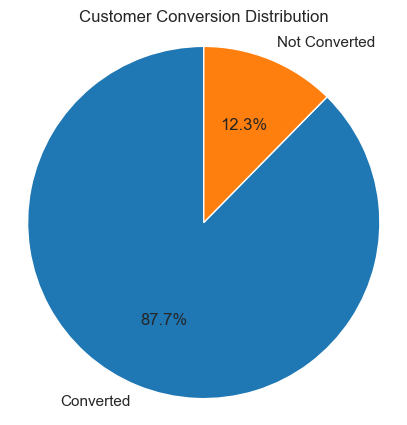

In [48]:
labels = ['Converted', 'Not Converted']
values = df['Conversion'].value_counts()
colors=['#1f77b4', '#ff7f0e']

plt.figure(figsize=(5, 5))
plt.pie(values, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)

plt.title("Customer Conversion Distribution")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show the plot
plt.show()

Shows heavy **Imbalance** in the data with:
- 12% belonging to class 0
- 88% belonging to class 1

<a id="basic"></a>
# <b><span style='color:blue'>Step 5.6 |</span><span style='color:red'> Splitting data into X and y set </span></b>


In [49]:
# Define the features (X) and the output labels (y)
X = df.drop('Conversion', axis=1)
y = df['Conversion'] 

In [50]:
y.value_counts()

Conversion
1    7012
0     988
Name: count, dtype: int64

<a id="basic"></a>
# <b><span style='color:blue'>Step 5.7 |</span><span style='color:red'> Over Sampling using SMOTE </span></b>


In [51]:
from imblearn.over_sampling import SMOTE

In [52]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Check the new class distribution
new_class_distribution = y_resampled.value_counts()
print(new_class_distribution)

Conversion
1    7012
0    7012
Name: count, dtype: int64


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.8 |</span><span style='color:red'> Spliting Data into Train and Test  </span></b>


In [53]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42,stratify=y_resampled)

In [54]:
# Print the shapes of the resulting sets
print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)
print("Training target shape:", y_train.shape)
print("Testing target shape:", y_test.shape)

Training set shape: (11219, 24)
Testing set shape: (2805, 24)
Training target shape: (11219,)
Testing target shape: (2805,)


<a id="basic"></a>
# <b><span style='color:blue'>Step 5.9 |</span><span style='color:red'> Scaling Numerical Columns  </span></b>


In [55]:
numerical_cols = ['Age', 'Income', 'AdSpend', 'ClickThroughRate', 'ConversionRate',
                  'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite', 'SocialShares',
                  'EmailOpens', 'EmailClicks', 'PreviousPurchases', 'LoyaltyPoints']

In [56]:
# Initialize scaler
scaler = StandardScaler()

# Fit on training data numerical columns
X_train[numerical_cols] = scaler.fit_transform(X_train[numerical_cols])

# Transform test data numerical columns
X_test[numerical_cols] = scaler.transform(X_test[numerical_cols])

In [57]:
X_train.head()

,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,...,Gender_Male,CampaignChannel_Email,CampaignChannel_PPC,CampaignChannel_Referral,CampaignChannel_SEO,CampaignChannel_Social Media,CampaignType_Awareness,CampaignType_Consideration,CampaignType_Conversion,CampaignType_Retention
2224,0.685275,-0.790353,-1.232939,0.818984,-1.355811,0.339270,-0.778379,-1.403490,1.501095,0.833101,...,0,1,0,0,0,0,0,0,0,1
5308,0.254001,-0.321464,1.470997,0.224511,-0.969399,1.430018,1.863138,-0.867097,-1.865357,-0.632998,...,0,0,1,0,0,0,0,0,0,1
11568,-0.249151,1.498519,0.729909,1.497862,0.386207,-1.187776,-0.613549,1.464324,-0.107321,0.100052,...,0,0,0,0,0,0,0,0,0,0
9813,-0.033514,-1.348645,1.364625,-1.351432,-1.043838,0.993719,-1.018782,-0.731065,-0.967636,-1.182785,...,0,1,0,0,0,0,0,0,0,0
1825,0.541517,1.201634,-1.423096,-0.812299,1.143298,-0.097029,0.917437,-1.566180,1.276665,-1.549309,...,1,0,1,0,0,0,0,0,0,1


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 6 | Logistic Regression Model Building</p>


In [58]:

# Define parameter grid for Logistic Regression
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear']  # 'liblinear' supports both l1 and l2 penalties
}

# Initialize base model
lr = LogisticRegression(random_state=42)

# Create StratifiedKFold cross-validator
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=lr,
    param_grid=param_grid,
    cv=cv,
    scoring='f1',
    n_jobs=-1
)

# Perform grid search
grid_search.fit(X_train, y_train)

# Extract best parameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)


# Initialize Logistic Regression with best parameters
final_lr_model = LogisticRegression(
    penalty=best_params['penalty'],
    C=best_params['C'],
    solver=best_params['solver'],
    random_state=42
)

# Train the final model
final_lr_model.fit(X_train, y_train)


Best Hyperparameters: {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}


LogisticRegression(C=100, penalty='l1', random_state=42, solver='liblinear')

In [59]:
# Make predictions
y_pred = final_lr_model.predict(X_test)

# Evaluation Metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

In [60]:
# Print evaluation results
print("\nModel Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")


Model Evaluation Metrics:
Accuracy : 0.9358
Precision: 0.8947
Recall   : 0.9879
F1 Score : 0.9390


In [61]:
# Generate classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      1403
           1       0.89      0.99      0.94      1402

    accuracy                           0.94      2805
   macro avg       0.94      0.94      0.94      2805
weighted avg       0.94      0.94      0.94      2805



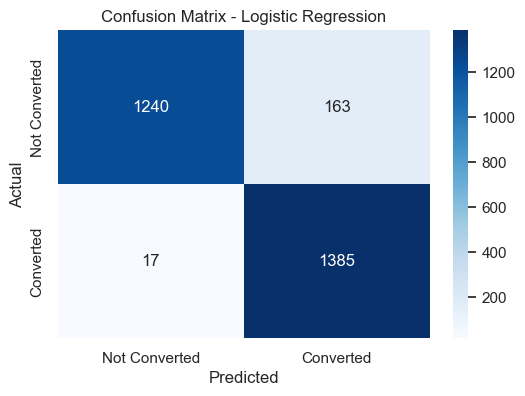

In [62]:
# Confusion matrix as heatmap
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Not Converted", "Converted"],
            yticklabels=["Not Converted", "Converted"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Logistic Regression')
plt.show()

<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 7 | Decision Tree Model Building</p>


In [63]:


# Define parameter grid for GridSearchCV
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize base Decision Tree
dt = DecisionTreeClassifier(random_state=42)

# StratifiedKFold for cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(estimator=dt,
                           param_grid=param_grid,
                           cv=cv,
                           scoring='f1',
                           n_jobs=-1)

# Fit to training data
grid_search.fit(X_train, y_train)


# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [64]:
# Final model with best params
final_dt_model = DecisionTreeClassifier(
    criterion=best_params['criterion'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    random_state=42
)

# Fit final model
final_dt_model.fit(X_train, y_train)

# Predict on test set
y_pred = final_dt_model.predict(X_test)

# Evaluate
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

In [65]:
# Show metrics
print("Model Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

Model Evaluation Metrics:
Accuracy : 0.8770
Precision: 0.8849
Recall   : 0.8666
F1 Score : 0.8757


In [66]:
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.89      0.88      1403
           1       0.88      0.87      0.88      1402

    accuracy                           0.88      2805
   macro avg       0.88      0.88      0.88      2805
weighted avg       0.88      0.88      0.88      2805



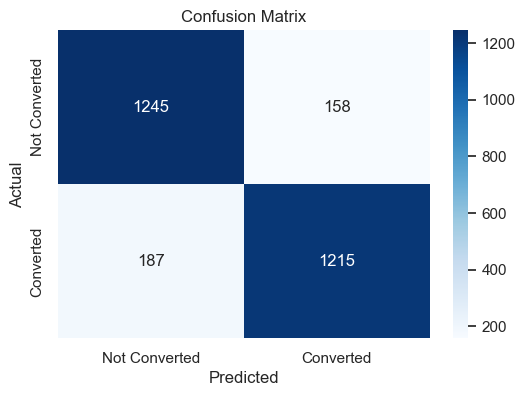

In [67]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Converted", "Converted"], yticklabels=["Not Converted", "Converted"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 8 | Random Forest Model Building</p>


In [68]:

# Define parameter grid for Random Forest
param_grid = {
    'n_estimators': [10, 50, 200],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Initialize base Random Forest
rf = RandomForestClassifier(random_state=42)

# StratifiedKFold for consistent class representation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=rf,
                           param_grid=param_grid,
                           cv=cv,
                           scoring='f1',
                           n_jobs=-1)

# Fit to training data
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [69]:
# Final model with best parameters
final_rf_model = RandomForestClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    criterion=best_params['criterion'],
    random_state=42
)

# Fit final model on full training data
final_rf_model.fit(X_train, y_train)

# Predict on test set
y_pred = final_rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

In [70]:
# Display results
print("Random Forest Model Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

Random Forest Model Evaluation Metrics:
Accuracy : 0.9487
Precision: 0.9122
Recall   : 0.9929
F1 Score : 0.9508


In [71]:
# Generate classification report
report = classification_report(y_test, y_pred)
print("Classification Report:")
print(report)


Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.90      0.95      1403
           1       0.91      0.99      0.95      1402

    accuracy                           0.95      2805
   macro avg       0.95      0.95      0.95      2805
weighted avg       0.95      0.95      0.95      2805



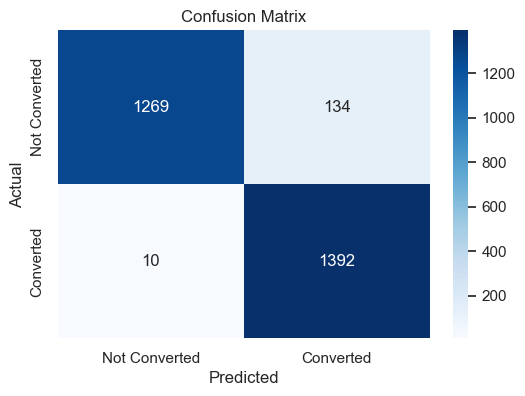

In [72]:
# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Not Converted", "Converted"], yticklabels=["Not Converted", "Converted"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 9 | SVM Model Building</p>


In [73]:

# Define parameter grid for SVM
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto']  # used for non-linear kernels
}

# Initialize SVC
svm = SVC(random_state=42)

# Stratified K-Fold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=svm,
                           param_grid=param_grid,
                           cv=cv,
                           scoring='f1',
                           n_jobs=-1)

# Fit grid search
grid_search.fit(X_train, y_train)


# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}


In [74]:
# Final SVM model with best params
final_svm_model = SVC(
    C=best_params['C'],
    kernel=best_params['kernel'],
    gamma=best_params['gamma'],
    random_state=42
)

# Fit final model
final_svm_model.fit(X_train, y_train)

# Predict on test set
y_pred = final_svm_model.predict(X_test)

# Evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

In [75]:
# Display metrics
print("Model Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")

Model Evaluation Metrics:
Accuracy : 0.9398
Precision: 0.9075
Recall   : 0.9793
F1 Score : 0.9420


In [76]:
# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.90      0.94      1403
           1       0.91      0.98      0.94      1402

    accuracy                           0.94      2805
   macro avg       0.94      0.94      0.94      2805
weighted avg       0.94      0.94      0.94      2805



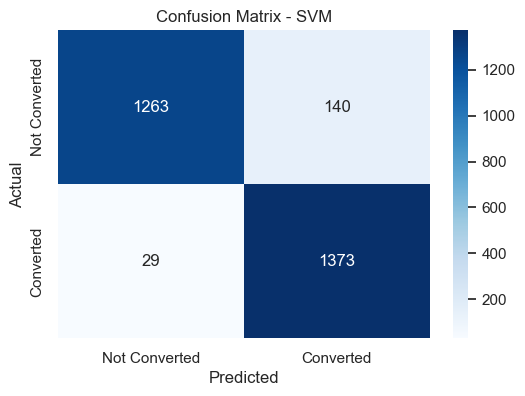

In [77]:

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Not Converted", "Converted"],
            yticklabels=["Not Converted", "Converted"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - SVM')
plt.show()

<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 10 | XGBoost  Model Building</p>


In [78]:

# Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Initialize base model
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV
grid_search = GridSearchCV(estimator=xgb,
                           param_grid=param_grid,
                           cv=cv,
                           scoring='f1',
                           n_jobs=-1,
                           verbose=1)

# Fit to training data
grid_search.fit(X_train, y_train)

# Best hyperparameters
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


C:\Users\DELL\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [11:33:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}


In [79]:
# Final model with best parameters
final_xgb_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42,
    **best_params
)

# Fit model
final_xgb_model.fit(X_train, y_train)

# Predict
y_pred = final_xgb_model.predict(X_test)

# Evaluate
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

C:\Users\DELL\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning: [11:33:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [80]:
print("\nModel Evaluation Metrics:")
print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1 Score : {f1:.4f}")


Model Evaluation Metrics:
Accuracy : 0.9554
Precision: 0.9254
Recall   : 0.9907
F1 Score : 0.9569


In [81]:
# Classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.92      0.95      1403
           1       0.93      0.99      0.96      1402

    accuracy                           0.96      2805
   macro avg       0.96      0.96      0.96      2805
weighted avg       0.96      0.96      0.96      2805



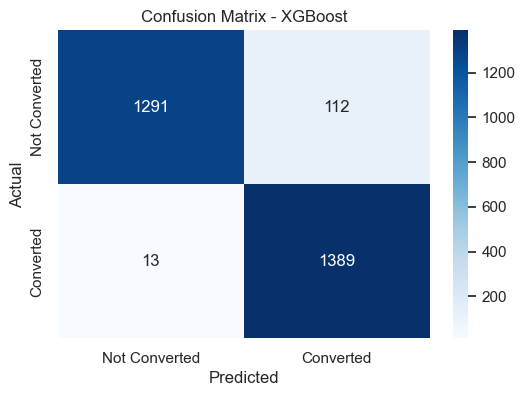

In [82]:
# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=["Not Converted", "Converted"],
            yticklabels=["Not Converted", "Converted"])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - XGBoost')
plt.show()


## Results :

-  **XGBoost Leads**: With **95% accuracy**, **92% precision**, and **99% recall**, XGBoost delivers the strongest overall performance, combining excellent predictive power and minimal false negatives.
-  **Random Forest Classifier**: Matches XGBoost’s **99% recall** and scores a **95% F1-score**, indicating a powerful balance between precision and recall.
-  **Support Vector Machine (SVM)**: Achieves **93% accuracy**, **90% precision**, and **97% recall**, maintaining solid, balanced classification performance.
-  **Logistic Regression**: Performs well with **93% accuracy**, high **recall (98%)**, but slightly lower **precision (89%)**, making it reliable for identifying positives.
-  **Decision Tree**: Trails behind others with **87% accuracy**, reflecting lower predictive consistency despite decent precision (**88%**) and recall (**86%**).


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 11 | AUC-ROC Curve For all Models</p>


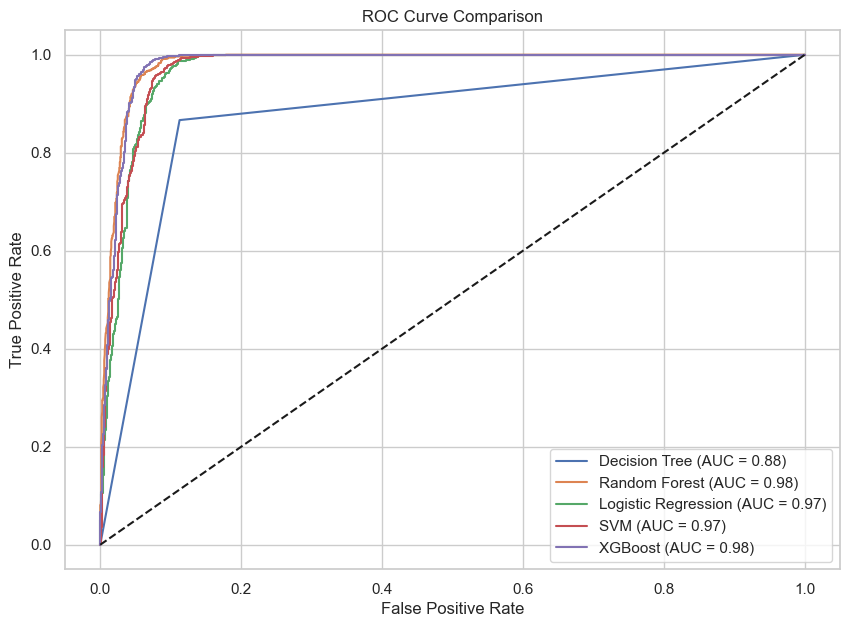

In [84]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities
dt_probs = final_dt_model.predict_proba(X_test)[:, 1]
rf_probs = final_rf_model.predict_proba(X_test)[:, 1]
lr_probs = final_lr_model.predict_proba(X_test)[:, 1]
svm_probs = final_svm_model.decision_function(X_test)
xgb_probs = final_xgb_model.predict_proba(X_test)[:, 1]

# Compute ROC curve and AUC for each model
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probs)
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_probs)
fpr_svm, tpr_svm, _ = roc_curve(y_test, svm_probs)
fpr_xgb, tpr_xgb, _ = roc_curve(y_test, xgb_probs)

auc_dt = auc(fpr_dt, tpr_dt)
auc_rf = auc(fpr_rf, tpr_rf)
auc_lr = auc(fpr_lr, tpr_lr)
auc_svm = auc(fpr_svm, tpr_svm)
auc_xgb = auc(fpr_xgb, tpr_xgb)

# Plotting
plt.figure(figsize=(10, 7))
plt.plot(fpr_dt, tpr_dt, label=f'Decision Tree (AUC = {auc_dt:.2f})')
plt.plot(fpr_rf, tpr_rf, label=f'Random Forest (AUC = {auc_rf:.2f})')
plt.plot(fpr_lr, tpr_lr, label=f'Logistic Regression (AUC = {auc_lr:.2f})')
plt.plot(fpr_svm, tpr_svm, label=f'SVM (AUC = {auc_svm:.2f})')
plt.plot(fpr_xgb, tpr_xgb, label=f'XGBoost (AUC = {auc_xgb:.2f})')

# Diagonal line
plt.plot([0, 1], [0, 1], 'k--')

# Plot aesthetics
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


<div style="border-radius:10px; padding: 15px; background-color: #d0f0fd; font-size:115%; text-align:left">

<h2 align="left"><font color=#4b0082>Inference from ROC Curve: Model AUC Comparison</font></h2>

- **XGBoost** and **Random Forest** lead with the highest AUC of <strong>0.98</strong>, indicating superior classification capability and excellent distinction between classes.
- **SVM** and **Logistic Regression** both show strong performance with an AUC of <strong>0.97</strong>, closely trailing the top models.
- **Decision Tree** lags with an AUC of <strong>0.87</strong>, reflecting comparatively weaker model performance and lower discriminative power.

<strong>Conclusion</strong>: XGBoost and Random Forest are the most reliable choices in terms of ROC-AUC, ideal for maximizing true positives while minimizing false positives.

</div>


<a id="import"></a>
# <p style="background-color:blue; font-family:calibri; color:white; font-size:150%; text-align:center; border-radius:15px 50px;">Step 12 |Final Conclusion</p>




###  1. Key Insights from EDA:

- **User Behavior**: Converting users engage more—more visits, more pages per visit, and longer time on site.
- **Email Impact**: Email clicks and opens are strong indicators of conversion success.
- **Demographics**:
  - **Age**: Users aged **26–65**, especially **36–45**, are most likely to convert.
  - **Income**: Higher income correlates with higher conversion rates.
- **Campaign Type**: Surprisingly, the **"Conversion"** campaign type had the lowest success. **Awareness**, **Retention**, and **Consideration** were more effective.
- **Gender & Channel**:
  - Gender has little impact on conversion.
  - **Referral** and **PPC** channels show slightly better conversion performance.

---

###  2. Model Performance Summary:

| Model                 | Accuracy | Precision | Recall | AUC  |
|----------------------|----------|-----------|--------|------|
| **XGBoost**           | 95%      | 92%       | 99%    | 0.98 |
| Random Forest        | 95%      | 91%       | 99%    | 0.98 |
| Support Vector Machine (SVM) | 93% | 90%       | 97%    | 0.97 |
| Logistic Regression  | 93%      | 89%       | 98%    | 0.97 |
| Decision Tree        | 87%      | 88%       | 86%    | 0.87 |

- **XGBoost** is the top performer with high accuracy, recall, and AUC.
- **Decision Tree** had the weakest overall performance.

---

###  3. Business Takeaways:

- Prioritize **high-income users aged 26–65**, particularly **36–45**.
- Strengthen **email marketing**—especially strategies that increase clicks and opens.
- Enhance **on-site engagement** through better UX and content.
- Reassess the **Conversion campaign type**; it underperformed expectations.
- **Deploy XGBoost** for production use—it offers the best trade-off between precision and recall.

